### Remove scroll from figures

In [4]:
%%javascript
IPython.OutputArea.prototype._should_scroll = function(lines) {
    return false;
}

<IPython.core.display.Javascript object>

## Extend the size of the Window

In [5]:
from IPython.display import display, HTML
display(HTML("<style>.container { width:100% !important; }</style>"))

## Load Modules

In [6]:
import netCDF4 as nc
import glob
import numpy as np
import pandas as pd
import xarray as xr
import itertools
import cftime
import cartopy.crs as ccrs
from datetime import datetime

import matplotlib.pyplot as plt
import matplotlib as mpl

from tqdm import tqdm

import jax.numpy as jnp
from jax import random
import numpyro
import numpyro.distributions as dist
from numpyro.infer import MCMC, NUTS, Predictive

## Read CMIP Data into xarray

In [7]:
# Define paths
geoDataPath = '/home/amunoz/climate_data/M2SMNXPCT.1/**/'
save_path = '/home/amunoz/climate_data/M2SMNXPCT.1/M2SMNXPCT.1.nc'

In [8]:
# Find files
geoFiles = glob.glob(geoDataPath + '*.nc4', recursive=True)
geoFiles


['/home/amunoz/climate_data/M2SMNXPCT.1/1982/MERRA2.statM_2d_pct_Nx.198212.nc4',
 '/home/amunoz/climate_data/M2SMNXPCT.1/1982/MERRA2.statM_2d_pct_Nx.198205.nc4',
 '/home/amunoz/climate_data/M2SMNXPCT.1/1982/MERRA2.statM_2d_pct_Nx.198209.nc4',
 '/home/amunoz/climate_data/M2SMNXPCT.1/1982/MERRA2.statM_2d_pct_Nx.198201.nc4',
 '/home/amunoz/climate_data/M2SMNXPCT.1/1982/MERRA2.statM_2d_pct_Nx.198208.nc4',
 '/home/amunoz/climate_data/M2SMNXPCT.1/1982/MERRA2.statM_2d_pct_Nx.198207.nc4',
 '/home/amunoz/climate_data/M2SMNXPCT.1/1982/MERRA2.statM_2d_pct_Nx.198210.nc4',
 '/home/amunoz/climate_data/M2SMNXPCT.1/1982/MERRA2.statM_2d_pct_Nx.198204.nc4',
 '/home/amunoz/climate_data/M2SMNXPCT.1/1982/MERRA2.statM_2d_pct_Nx.198206.nc4',
 '/home/amunoz/climate_data/M2SMNXPCT.1/1982/MERRA2.statM_2d_pct_Nx.198202.nc4',
 '/home/amunoz/climate_data/M2SMNXPCT.1/1982/MERRA2.statM_2d_pct_Nx.198211.nc4',
 '/home/amunoz/climate_data/M2SMNXPCT.1/1982/MERRA2.statM_2d_pct_Nx.198203.nc4',
 '/home/amunoz/climate_data/

### Create variables for geo run

In [9]:

# geo_data = None
# for file in geoFiles:
#     if geo_data is None:
#         geo_data = xr.open_dataset(file)
#     else:
#         geo_data = geo_data.combine_first(xr.open_dataset(file))

# geo_data.to_netcdf(save_path)


In [10]:
geo_data = xr.open_dataset(save_path)

In [11]:
geo_data

<xarray.Dataset> Size: 2GB
Dimensions:  (time: 516, lat: 361, lon: 576)
Coordinates:
  * lon      (lon) float64 5kB -180.0 -179.4 -178.8 -178.1 ... 178.1 178.8 179.4
  * lat      (lat) float64 3kB -90.0 -89.5 -89.0 -88.5 ... 88.5 89.0 89.5 90.0
  * time     (time) datetime64[ns] 4kB 1980-01-01T00:30:00 ... 2022-12-01T00:...
Data variables:
    T2MMEAN  (time, lat, lon) float32 429MB ...
    T2MMAX   (time, lat, lon) float32 429MB ...
    T2MMIN   (time, lat, lon) float32 429MB ...
    PRECTOT  (time, lat, lon) float32 429MB ...
Attributes: (12/30)
    ShortName:                         M2SMNXPCT
    LongName:                          MERRA-2 statM_2d_pct_Nx: 2d, Single-Le...
    VersionID:                         V1
    Description:                       Percentile of monthly MERRA-2 data bas...
    Format:                            NetCDF-4
    ProcessingLevel:                   Level 4
    ...                                ...
    LongitudeResolution:               0.625
    Title:                             MERRA-2 statM_2d_pct_Nx: 2d, Single-Le...
    Filename:                          MERRA2.statM_2d_pct_Nx.198212.nc4
    Institution:                       NASA Global Modeling and Assimilation ...
    DataResolution:                    0.5 x 0.625
    Contact:                           http://gmao.gsfc.nasa.gov

### Explore seasonal function family based on powers of sines

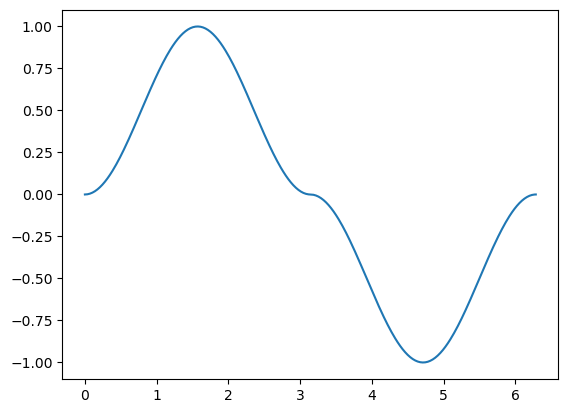

In [12]:
x = np.linspace(0,1,360)*2*np.pi
plt.plot(x, np.sign(np.sin(x))*np.pow(np.abs(np.sin(x)),2))

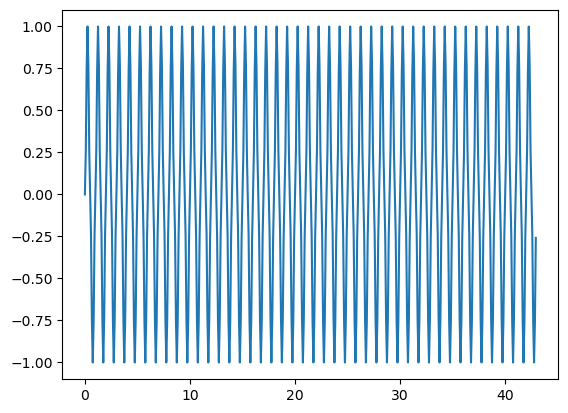

In [13]:
orbits = ((geo_data.time-np.min(geo_data.time))/np.timedelta64(1, 'D')/365.256).values

plt.plot(orbits, np.sign(np.sin(orbits*2*np.pi))*np.pow(np.abs(np.sin(orbits*2*np.pi)),2))

### Rebin data to coarser grids

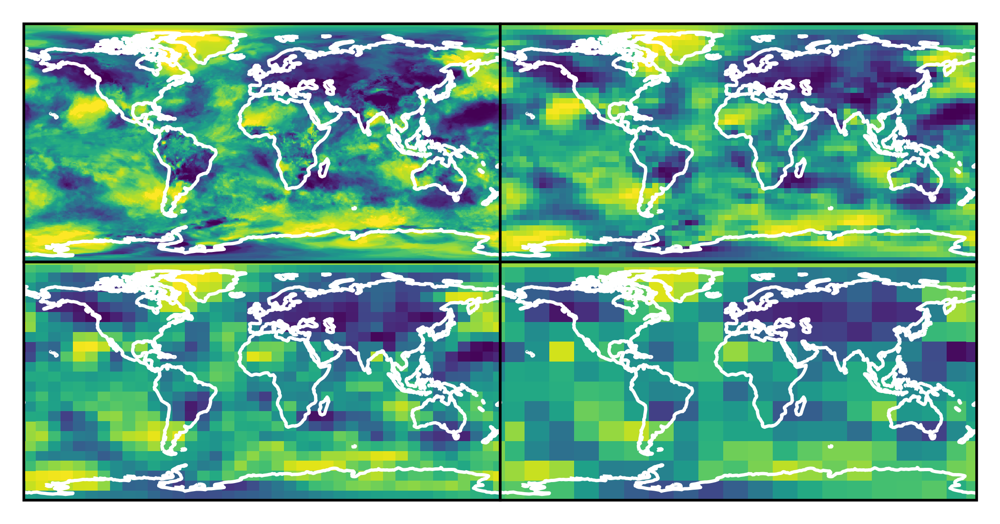

In [14]:
vmin = 0
vmax = 100

fig = plt.figure(figsize=2*np.array([2, 1]), dpi=500)
gs0 = fig.add_gridspec(2, 2, wspace=0.0, hspace=0, left=0, right=1, bottom=0, top=1)

ax = fig.add_subplot(gs0[0, 0], projection=ccrs.PlateCarree())
geo_data.T2MMEAN.isel(time=0).plot(ax=ax, add_colorbar=False, vmin=vmin, vmax=vmax, add_labels=False)
ax.coastlines(color='w')

geo_data_coarse8 = geo_data.coarsen(lon=8, lat=8, boundary='pad').mean()
ax = fig.add_subplot(gs0[0, 1], projection=ccrs.PlateCarree())
geo_data_coarse8.T2MMEAN.isel(time=0).plot(ax=ax, add_colorbar=False, vmin=vmin, vmax=vmax, add_labels=False)
ax.coastlines(color='w')

geo_data_coarse15 = geo_data.coarsen(lon=15, lat=15, boundary='pad').mean()
ax = fig.add_subplot(gs0[1, 0], projection=ccrs.PlateCarree())
geo_data_coarse15.T2MMEAN.isel(time=0).plot(ax=ax, add_colorbar=False, vmin=vmin, vmax=vmax, add_labels=False)
ax.coastlines(color='w')

geo_data_coarse30 = geo_data.coarsen(lon=30, lat=30, boundary='pad').mean()
ax = fig.add_subplot(gs0[1, 1], projection=ccrs.PlateCarree())
geo_data_coarse30.T2MMEAN.isel(time=0).plot(ax=ax, add_colorbar=False, vmin=vmin, vmax=vmax, add_labels=False)
ax.coastlines(color='w')

In [15]:
np.percentile(geo_data_coarse30.T2MMEAN.values, [1, 25,50,75,99])

array([ 3.33333373, 32.46905422, 52.11481857, 70.41694832, 95.78115746])

In [16]:
geo_data_coarse30

<xarray.Dataset> Size: 2MB
Dimensions:  (time: 516, lat: 13, lon: 20)
Coordinates:
  * lon      (lon) float64 160B -170.9 -152.2 -133.4 ... 147.8 166.6 177.8
  * lat      (lat) float64 104B -82.75 -67.75 -52.75 -37.75 ... 67.25 82.25 90.0
  * time     (time) datetime64[ns] 4kB 1980-01-01T00:30:00 ... 2022-12-01T00:...
Data variables:
    T2MMEAN  (time, lat, lon) float32 537kB 73.89 71.24 70.06 ... 53.15 53.15
    T2MMAX   (time, lat, lon) float32 537kB 68.6 68.35 67.02 ... 49.1 49.1 49.1
    T2MMIN   (time, lat, lon) float32 537kB 75.35 72.23 71.95 ... 56.27 56.27
    PRECTOT  (time, lat, lon) float32 537kB 65.08 65.6 66.05 ... 85.25 85.25
Attributes: (12/30)
    ShortName:                         M2SMNXPCT
    LongName:                          MERRA-2 statM_2d_pct_Nx: 2d, Single-Le...
    VersionID:                         V1
    Description:                       Percentile of monthly MERRA-2 data bas...
    Format:                            NetCDF-4
    ProcessingLevel:                   Level 4
    ...                                ...
    LongitudeResolution:               0.625
    Title:                             MERRA-2 statM_2d_pct_Nx: 2d, Single-Le...
    Filename:                          MERRA2.statM_2d_pct_Nx.198212.nc4
    Institution:                       NASA Global Modeling and Assimilation ...
    DataResolution:                    0.5 x 0.625
    Contact:                           http://gmao.gsfc.nasa.gov

In [17]:
geo_data_coarse30.T2MMEAN.values

array([[[73.88887  , 71.2434   , 70.06271  , ..., 73.65566  ,
         62.347496 , 69.82028  ],
        [84.83129  , 91.44876  , 85.42533  , ..., 67.64966  ,
         78.26998  , 80.53275  ],
        [65.86409  , 45.61782  , 36.482677 , ..., 50.06657  ,
         71.636696 , 80.1516   ],
        ...,
        [43.82021  , 29.608656 , 22.647427 , ..., 76.89031  ,
         81.32226  , 70.3511   ],
        [65.1411   , 52.62555  , 53.987507 , ..., 42.487274 ,
         58.646416 , 68.15425  ],
        [84.19954  , 84.19954  , 84.19954  , ..., 84.19954  ,
         84.19954  , 84.199554 ]],

       [[85.9427   , 92.187706 , 93.153465 , ..., 77.816345 ,
         84.719086 , 85.17403  ],
        [86.88219  , 92.3943   , 90.506065 , ..., 69.37279  ,
         73.966644 , 76.25041  ],
        [85.20239  , 63.001556 , 47.311096 , ..., 41.485916 ,
         80.21044  , 86.90345  ],
        ...,
        [62.07233  , 76.92955  , 82.32561  , ..., 42.011967 ,
         50.40395  , 48.050663 ],
        [52.

### Define numpyro model only with diurnal and seasonal variation

In [18]:
# def model(precipitation, orbits):
#     # Seasonal variation
#     mu_exponent = numpyro.sample("mu_exponent", dist.TruncatedNormal(1.0, 3.0, low=0))
#     sigma_exponent = numpyro.sample("sigma_exponent", dist.HalfNormal(2.0))
#     mu_shift = numpyro.sample("mu_shift", dist.Normal(0.0, 1.0))
#     sigma_shift = numpyro.sample("sigma_shift", dist.HalfNormal(1.0))
#     mu_amplitude = numpyro.sample("mu_amplitude", dist.Normal(0.0, 3.0))
#     sigma_amplitude = numpyro.sample("sigma_amplitude", dist.HalfNormal(3.0))

#     # Offset
#     mu_offset = numpyro.sample("mu_offset", dist.TruncatedNormal(50.0,  20.0, low=0, high=100))
#     sigma_offset = numpyro.sample("sigma_offset", dist.HalfNormal(20.0))
#     sigma = numpyro.sample("sigma", dist.HalfNormal(20.0))

#     with numpyro.plate("longitude_i", precipitation.shape[2]):
#         with numpyro.plate("latitude_j", precipitation.shape[1]):
#             exponent = numpyro.sample("exponent", dist.Normal(mu_exponent, sigma_exponent))
#             shift = numpyro.sample("shift", dist.Normal(mu_shift, sigma_shift))
#             amplitude = numpyro.sample("amplitude", dist.Normal(mu_amplitude, sigma_amplitude))
#             offset = numpyro.sample("offset", dist.Normal(mu_offset, sigma_offset))
            

#             precipitation_estimate = amplitude*jnp.sign(jnp.sin((orbits - shift)*2*jnp.pi))*jnp.pow(jnp.abs(jnp.sin((orbits - shift)*2*jnp.pi)),exponent) + offset

#             # with numpyro.plate("times", precipitation.shape[0]):
#             numpyro.sample("obs", dist.Normal(precipitation_estimate, sigma), obs=precipitation)


In [19]:
def model(orbits, precipitation=None):
    # Seasonal variation
    shift_mu = numpyro.sample("shift_mu", dist.Normal(0.0, 1.0))
    shift_sigma = numpyro.sample("shift_sigma", dist.HalfNormal(1.0))
    amplitude_mu = numpyro.sample("amplitude_mu", dist.Normal(20.0, 20.0))
    amplitude_sigma = numpyro.sample("amplitude_sigma", dist.HalfNormal(20.0))

    # Offset
    offset_mu = numpyro.sample("offset_mu", dist.TruncatedNormal(50.0,  20.0, low=0, high=100))
    offset_sigma = numpyro.sample("offset_sigma", dist.HalfNormal(20.0))
    sigma = numpyro.sample("sigma", dist.HalfNormal(20.0))

    with numpyro.plate("longitude_i", precipitation.shape[2]):
        with numpyro.plate("latitude_j", precipitation.shape[1]):
            shift = numpyro.sample("shift", dist.Normal(shift_mu, shift_sigma))
            amplitude = numpyro.sample("amplitude", dist.Normal(amplitude_mu, amplitude_sigma))
            offset = numpyro.sample("offset", dist.Normal(offset_mu, offset_sigma))
            

            precipitation_estimate = amplitude*jnp.abs(jnp.sin((orbits - shift)*2*jnp.pi)) + offset

            with numpyro.plate("times", precipitation.shape[0]):
                numpyro.sample("obs", dist.Normal(precipitation_estimate, sigma), obs=precipitation)


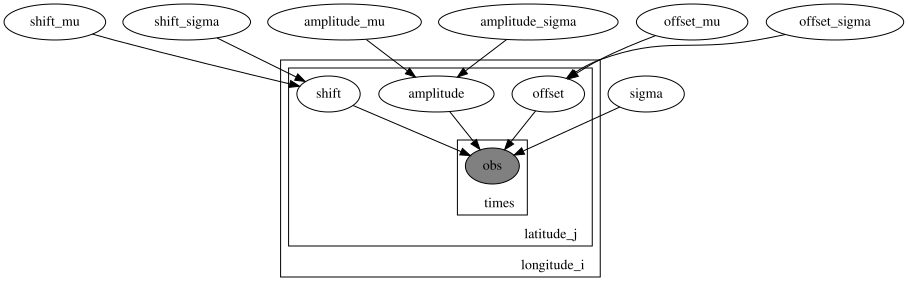

In [20]:
numpyro.render_model(model, model_args=(geo_data_coarse30.T2MMEAN.values, orbits[:,None,None]))

In [21]:
with numpyro.handlers.seed(rng_seed=1):
    trace = numpyro.handlers.trace(model).get_trace(geo_data_coarse30.T2MMEAN.values, orbits[:,None,None])
print(numpyro.util.format_shapes(trace))

       Trace Shapes:             
        Param Sites:             
       Sample Sites:             
       shift_mu dist            |
               value            |
    shift_sigma dist            |
               value            |
   amplitude_mu dist            |
               value            |
amplitude_sigma dist            |
               value            |
      offset_mu dist            |
               value            |
   offset_sigma dist            |
               value            |
          sigma dist            |
               value            |
   longitude_i plate          1 |
    latitude_j plate          1 |
          shift dist      1   1 |
               value      1   1 |
      amplitude dist      1   1 |
               value      1   1 |
         offset dist      1   1 |
               value      1   1 |
         times plate        516 |
            obs dist 516 13  20 |
               value 516  1   1 |


In [22]:
nuts_kernel = NUTS(model)

mcmc = MCMC(nuts_kernel, num_samples=500, num_warmup=500)
rng_key = random.PRNGKey(0)
mcmc.run(rng_key, geo_data_coarse30.T2MMEAN.values, orbits[:,None,None])

posterior_samples = mcmc.get_samples()

sample: 100%|██████████| 1000/1000 [05:57<00:00,  2.79it/s, 255 steps of size 9.89e-03. acc. prob=0.70]


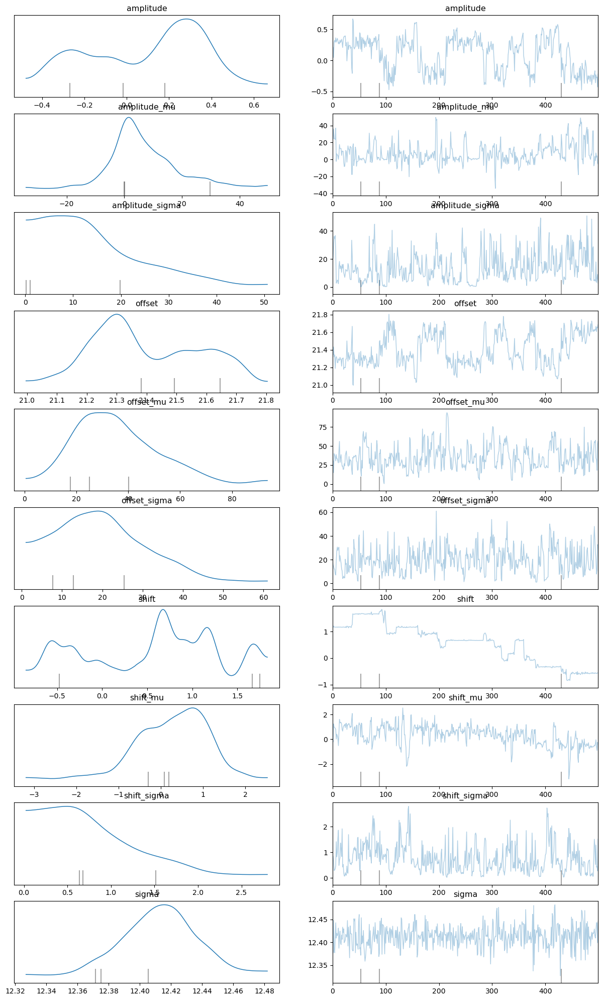

In [23]:
import arviz as az

data = az.from_numpyro(mcmc)
az.plot_trace(data, compact=True, figsize=(15, 25));

## Read Sunspot Data and create xarray

In [11]:
# Define path
snDataPath = '../../data/Sunspot Number/SN_m_tot_V2.0.csv'

# Read cr monthly average file with custom column names
colnames=['year', 'month', 'FracYear', 'SN', 'crsd', 'NObs', 'prov'] 
sn = pd.read_csv(snDataPath, delimiter=';', names=colnames)
sn['day'] = 15
sn['time'] = pd.to_datetime(sn.loc[:,['year', 'month', 'day']])
sn = sn.set_index('time', drop=True)
sn = sn.to_xarray().convert_calendar("noleap")

# Convert to seasonal average
month_length = sn.time.dt.days_in_month
sn = ((sn['SN'] * month_length).resample(time='QS-DEC').sum() / 
          month_length.resample(time='QS-DEC').sum()).to_dataset(name = 'sn')

# sn['SNav'] = sn['SN'].rolling(time=12, min_periods=1, center=True).mean()
# sn = sn.sel(time=slice(np.min(hist_sol.time.data)-pd.Timedelta(0, 'd'), np.max(hist_sol.time.data)))

# Reset index to middle of the season
sn['time'] = sn['time'] + pd.to_timedelta(45, 'd')
# Select only whole seasons
sn = sn.sel(time=slice('1981-01-01', '2022-12-31'))
sn['time'] = xr.CFTimeIndex.to_datetimeindex(sn['time'], unsafe=True)

sn


<xarray.Dataset>
Dimensions:  (time: 168)
Coordinates:
  * time     (time) datetime64[ns] 1981-01-15 1981-04-15 ... 2022-10-16
Data variables:
    sn       (time) float64 198.1 205.3 193.8 215.8 ... 61.24 86.39 78.86 89.73

## Read Neutron Monitor Data and create xarray

In [12]:
# Define path
crDataPath = '../../data/Cosmic Rays/OULU_1964_04_01 _00_00_2023_04_12 _23_30.csv'

# Read cr monthly average file with custom column names\
cr = pd.read_csv(crDataPath)
cr['time'] = pd.to_datetime(cr['Timestamp']).dt.tz_localize(None)
cr = cr.set_index('time', drop=True)
cr = cr.to_xarray().convert_calendar("noleap")
# cr['crav'] = cr['CorrectedCountRate[cts/min]'].rolling(time=365, min_periods=1, center=True).mean()
# cr = cr.sel(time=slice(np.min(hist_sol.time.data)-pd.Timedelta(0, 'd'), np.max(hist_sol.time.data)))

# Convert to seasonal average
cr = cr['CorrectedCountRate[cts/min]'].resample(time='QS-DEC').mean().to_dataset(name = 'cr')

# Reset index to middle of the season
cr['time'] = cr['time'] + pd.to_timedelta(45, 'd')
# Select only whole seasons
cr = cr.sel(time=slice('1981-01-01', '2022-12-31'))
cr['time'] = xr.CFTimeIndex.to_datetimeindex(cr['time'], unsafe=True)

cr

<xarray.Dataset>
Dimensions:  (time: 168)
Coordinates:
  * time     (time) datetime64[ns] 1981-01-15 1981-04-15 ... 2022-10-16
Data variables:
    cr       (time) float64 5.643e+03 5.556e+03 ... 6.334e+03 6.354e+03

## Plot solar data

(3666.0, 19281.0)

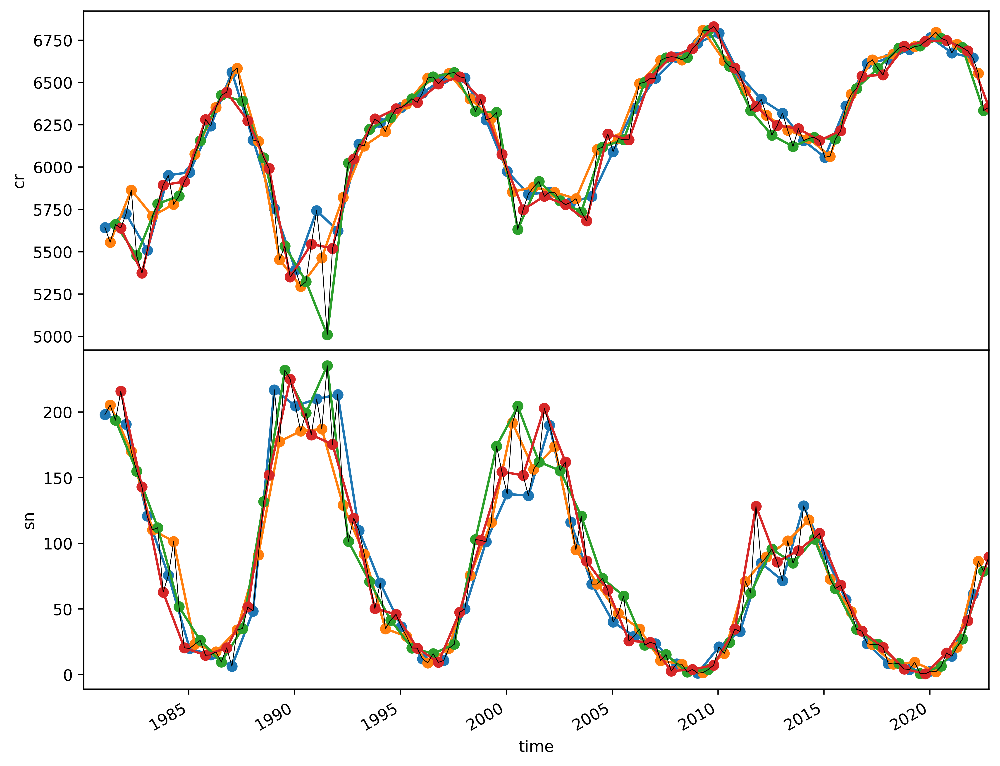

In [13]:
months = np.fromiter(geo_data.groupby('time.month').groups.keys(), dtype=int)

fig = plt.figure(figsize=2*np.array([4, 3]), dpi=500)
gs0 = fig.add_gridspec(2, 1, wspace=0.15, hspace=0, left=0, right=1, bottom=0, top=1)

ax = fig.add_subplot(gs0[0, 0])
cr_slice = cr.groupby('time.month')
for month in months:
    tt = cr_slice[month]['cr']
    tt.plot(ax=ax, marker='o')

cr['cr'].plot(ax=ax, c='k', lw=0.5)
ax.set_xlim([np.nanmin(geo_data.time.data), np.nanmax(geo_data.time.data)])


ax = fig.add_subplot(gs0[1, 0])
sn_slice = sn.groupby('time.month')
for month in months:  
    tt = sn_slice[month]['sn']
    tt.plot(ax=ax, marker='o')

sn['sn'].plot(ax=ax, c='k', lw=0.5)
ax.set_xlim([geo_data.time.data[0], geo_data.time.data[-1]])

## Run Bivariate analysis

Adding data with properties: 2 processes, 42 samples, 1 replications
overwriting existing data

####### analysing target with index 0 from list [0]

Target: 0 - testing sources [1]

---------------------------- (1) include target candidates
candidate set: [(0, 1), (0, 2), (0, 3), (0, 4), (0, 5), (0, 6), (0, 7), (0, 8), (0, 9), (0, 10), (0, 11), (0, 12), (0, 13), (0, 14), (0, 15), (0, 16), (0, 17), (0, 18), (0, 19), (0, 20), (0, 21), (0, 22), (0, 23), (0, 24)]
testing candidate: (0, 18) 
maximum statistic, n_perm: 200
testing candidate: (0, 23) maximum statistic, n_perm: 200
testing candidate: (0, 1) maximum statistic, n_perm: 200
 -- not significant

---------------------------- (2) include source candidates
candidate set current source: [(1, 1), (1, 2), (1, 3), (1, 4), (1, 5), (1, 6), (1, 7), (1, 8), (1, 9), (1, 10), (1, 11), (1, 12), (1, 13), (1, 14), (1, 15), (1, 16), (1, 17), (1, 18), (1, 19), (1, 20), (1, 21), (1, 22), (1, 23), (1, 24)]
testing candidate: (1, 13) maximum statistic

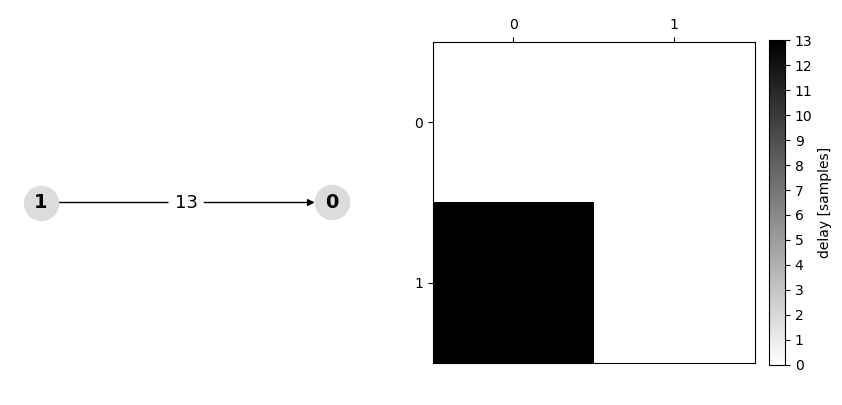

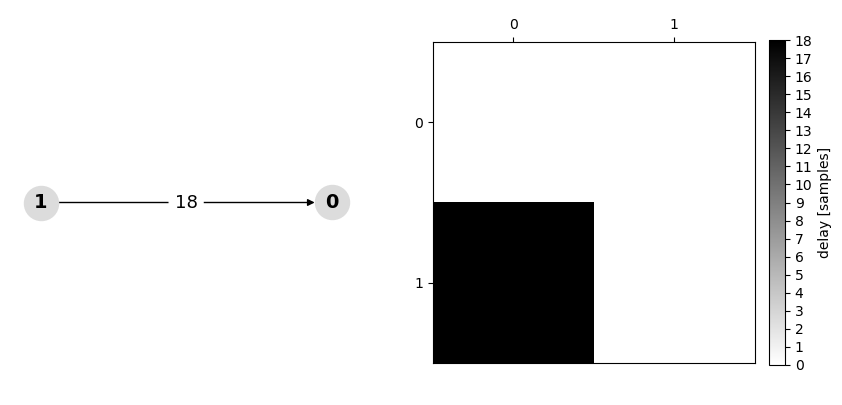

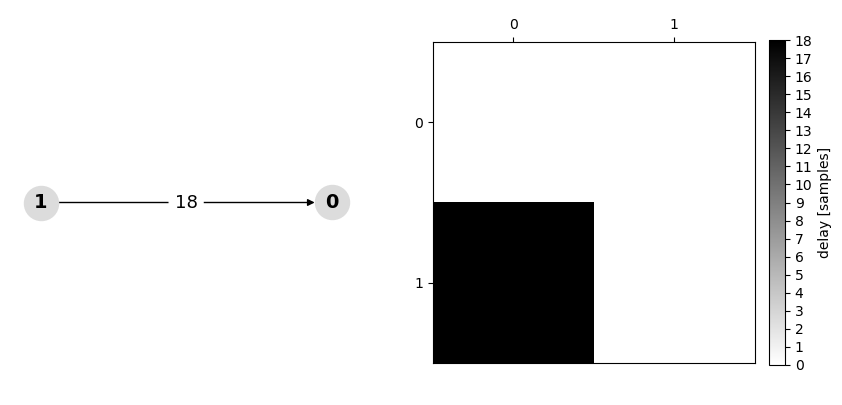

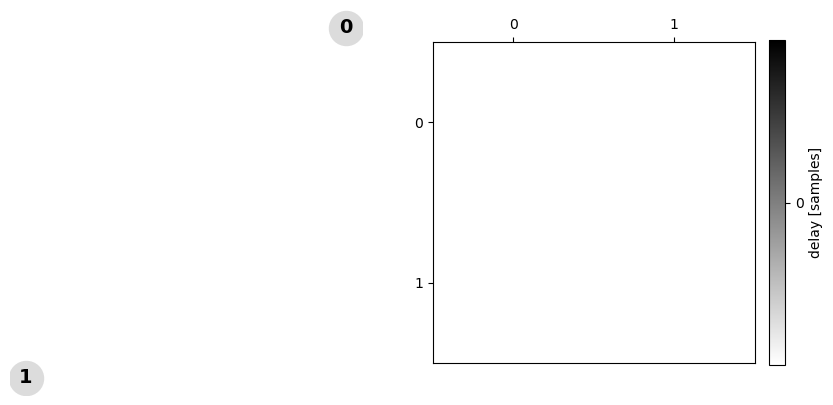

In [14]:
network_analysis = BivariateTE()
settings = {'cmi_estimator': 'JidtGaussianCMI',
            'max_lag': 24,
            'max_lag_sources': 24,
            'min_lag_sources': 1}

# settings = {'cmi_estimator': 'OpenCLKraskovCMI',
#             'max_lag': 24,
#             'max_lag_sources': 24,
#             'min_lag_sources': 1}

# settings = {'cmi_estimator': 'JidtKraskovCMI',
#             'max_lag': 24,
#             'max_lag_sources': 24,
#             'min_lag_sources': 1}

# settings = {'cmi_estimator': 'NumbaCudaKraskovCMI',
#             'max_lag': 24,
#             'max_lag_sources': 24,
#             'min_lag_sources': 1}

sn_slice = sn.groupby('time.month')
cr_slice = cr.groupby('time.month')
for month in months:
    dataList = [cr_slice[month]['cr'].data, sn_slice[month]['sn'].data]
    idt_data = Data(np.column_stack((itertools.zip_longest(*dataList, fillvalue=0))), dim_order='ps')
    results = network_analysis.analyse_network(settings=settings, data=idt_data, sources=[1], targets=[0])

    results.print_edge_list(weights='max_te_lag', fdr=False)
    plot_network(results=results, weights='max_te_lag', fdr=False)
    results.get_adjacency_matrix('max_te_lag', fdr=False).print_matrix()

            

## Select a random month, latitude, and longitude and plot

(3666.0, 19281.0)

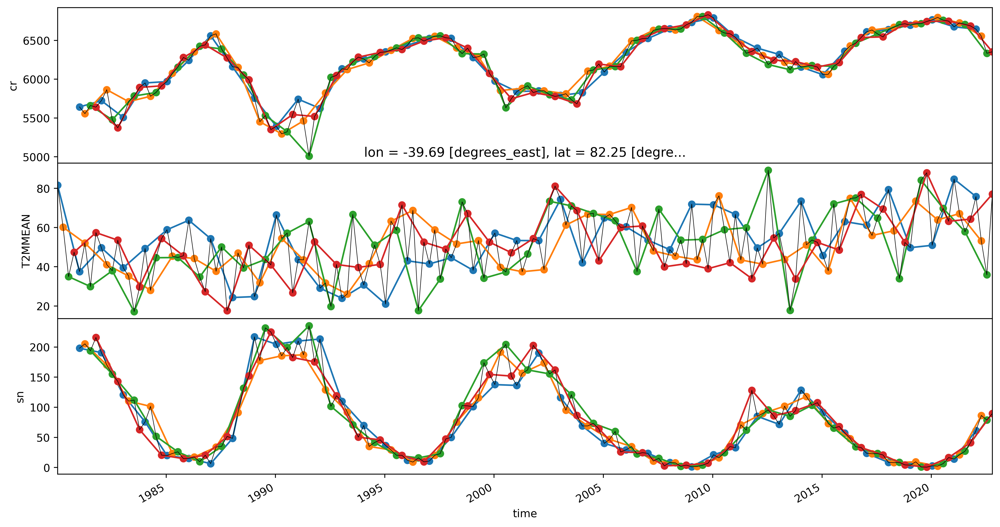

In [15]:
months = np.fromiter(geo_data_coarse.groupby('time.month').groups.keys(), dtype=int)
month = np.random.choice(months)
lat = geo_data_coarse.lat.data[np.random.randint(0, geo_data_coarse.lat.shape[0]-1)]
lon = geo_data_coarse.lon.data[np.random.randint(0, geo_data_coarse.lon.shape[0]-1)]


fig = plt.figure(figsize=2*np.array([6, 3]), dpi=500)
gs0 = fig.add_gridspec(3, 1, wspace=0.15, hspace=0, left=0, right=1, bottom=0, top=1)


ax = fig.add_subplot(gs0[0, 0])
cr_slice = cr.groupby('time.month')
for month in months:  
    cr_slice[month]['cr'].plot(ax=ax, marker='o')

cr['cr'].plot(ax=ax, c='k', lw=0.5)
ax.set_xlim([np.min(geo_data_coarse.time.data), np.max(geo_data_coarse.time.data)])



ax = fig.add_subplot(gs0[1, 0])

geo_slice = geo_data_coarse.groupby('lat')[lat].groupby('lon')[lon].groupby('time.month')
for month in months:
    geo_slice[month]['T2MMEAN'].plot(ax=ax, marker='o')

geo_data_coarse['T2MMEAN'].groupby('lat')[lat].groupby('lon')[lon].plot(ax=ax, c='k', lw=0.5)
ax.set_xlim([np.min(geo_data_coarse.time.data), np.max(geo_data_coarse.time.data)])


ax = fig.add_subplot(gs0[2, 0])
sn_slice = sn.groupby('time.month')
for month in months:  
    sn_slice[month]['sn'].plot(ax=ax, marker='o')

sn['sn'].plot(ax=ax, c='k', lw=0.5)
ax.set_xlim([np.min(geo_data_coarse.time.data), np.max(geo_data_coarse.time.data)])

## Run Bivariate analysis with Sunspot number on random latitude and longitude

Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

####### analysing target with index 0 from list [0]

Target: 0 - testing sources [1]

---------------------------- (1) include target candidates
candidate set: [(0, 1), (0, 2), (0, 3), (0, 4), (0, 5), (0, 6), (0, 7), (0, 8), (0, 9), (0, 10), (0, 11), (0, 12), (0, 13), (0, 14), (0, 15), (0, 16), (0, 17), (0, 18), (0, 19), (0, 20), (0, 21), (0, 22), (0, 23), (0, 24)]
testing candidate: (0, 11) 
maximum statistic, n_perm: 200
 -- not significant

No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates
candidate set current source: [(1, 1), (1, 2), (1, 3), (1, 4), (1, 5), (1, 6), (1, 7), (1, 8), (1, 9), (1, 10), (1, 11), (1, 12), (1, 13), (1, 14), (1, 15), (1, 16), (1, 17), (1, 18), (1, 19), (1, 20), (1, 21), (1, 22), (1, 23), (1, 24)]
testing candidate: (1, 14) maximum statistic, n_perm: 200
 -- not significant



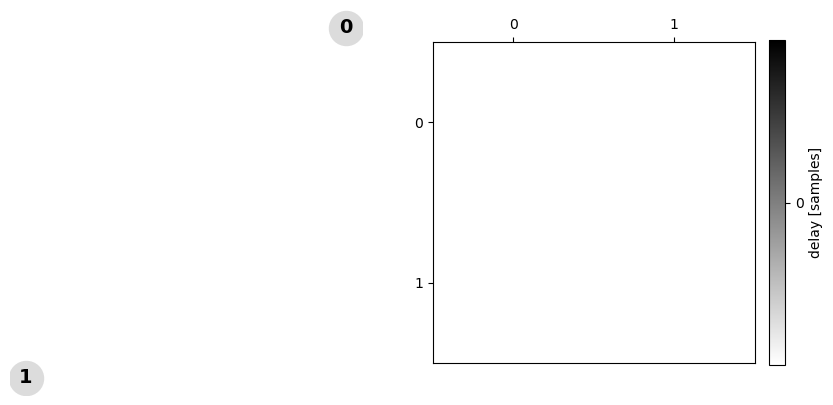

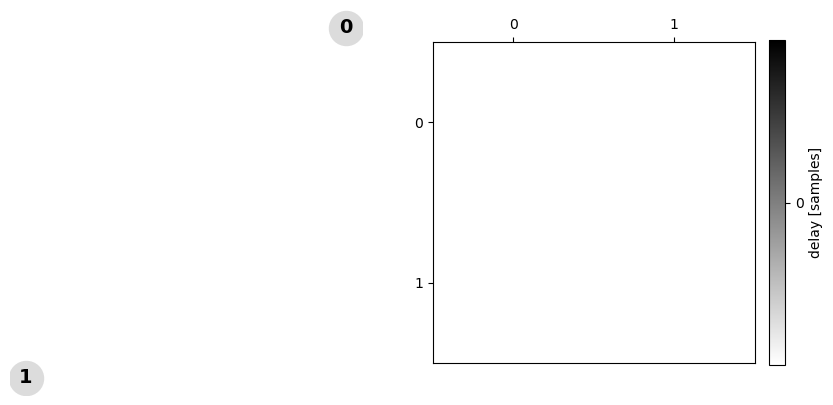

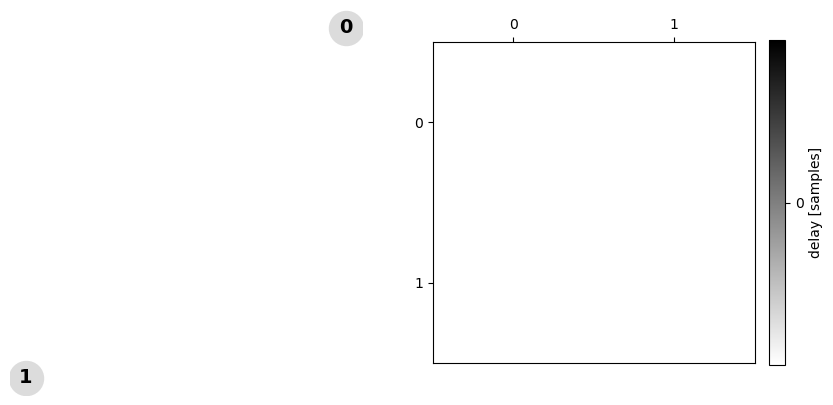

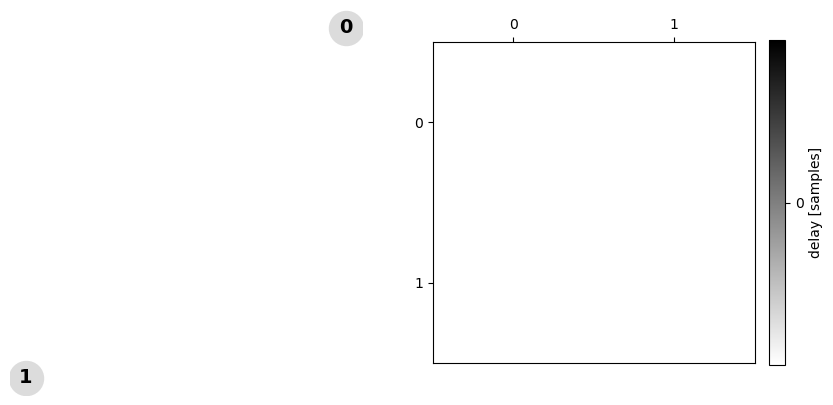

In [16]:
network_analysis = BivariateTE()
settings = {'cmi_estimator': 'JidtGaussianCMI',
            'max_lag': 24,
            'max_lag_sources': 24,
            'min_lag_sources': 1}

# settings = {'cmi_estimator': 'OpenCLKraskovCMI',
#             'max_lag': 24,
#             'max_lag_sources': 24,
#             'min_lag_sources': 1}



geo_slice = geo_data_coarse.groupby('lat')[lat].groupby('lon')[lon].groupby('time.month')
sn_slice = sn.groupby('time.month')
for month in months:
    dataList = [geo_slice[month]['T2MMEAN'].data.reshape(-1), sn_slice[month]['sn'].data]
    idt_data = Data(np.column_stack((itertools.zip_longest(*dataList, fillvalue=0))), dim_order='ps')
    results = network_analysis.analyse_network(settings=settings, data=idt_data, sources=[1], targets=[0])

    results.print_edge_list(weights='max_te_lag', fdr=False)
    plot_network(results=results, weights='max_te_lag', fdr=False)
    results.get_adjacency_matrix('max_te_lag', fdr=False).print_matrix()

            

## Run Bivariate analysis with Cosmic rays on random latitude and longitude

Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

####### analysing target with index 0 from list [0]

Target: 0 - testing sources [1]

---------------------------- (1) include target candidates
candidate set: [(0, 1), (0, 2), (0, 3), (0, 4), (0, 5), (0, 6), (0, 7), (0, 8), (0, 9), (0, 10), (0, 11), (0, 12), (0, 13), (0, 14), (0, 15), (0, 16), (0, 17), (0, 18), (0, 19), (0, 20), (0, 21), (0, 22), (0, 23), (0, 24)]
testing candidate: (0, 11) 
maximum statistic, n_perm: 200
 -- not significant

No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates
candidate set current source: [(1, 1), (1, 2), (1, 3), (1, 4), (1, 5), (1, 6), (1, 7), (1, 8), (1, 9), (1, 10), (1, 11), (1, 12), (1, 13), (1, 14), (1, 15), (1, 16), (1, 17), (1, 18), (1, 19), (1, 20), (1, 21), (1, 22), (1, 23), (1, 24)]
testing candidate: (1, 24) maximum statistic, n_perm: 200
 -- not significant



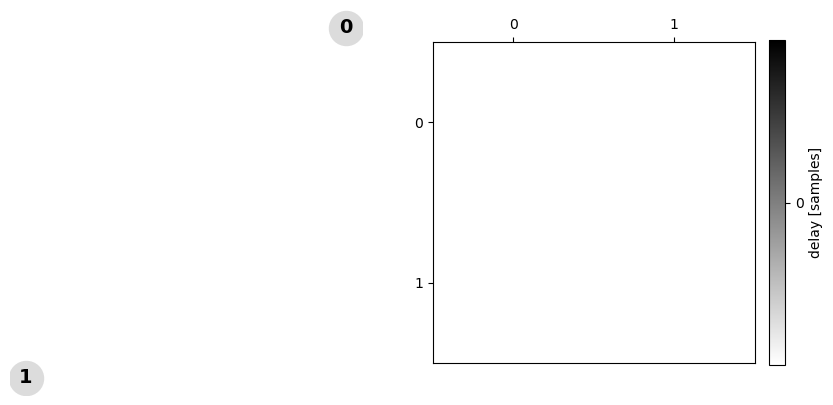

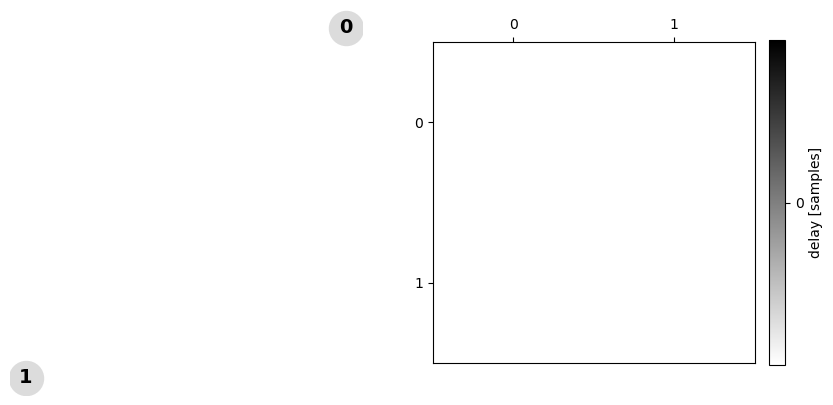

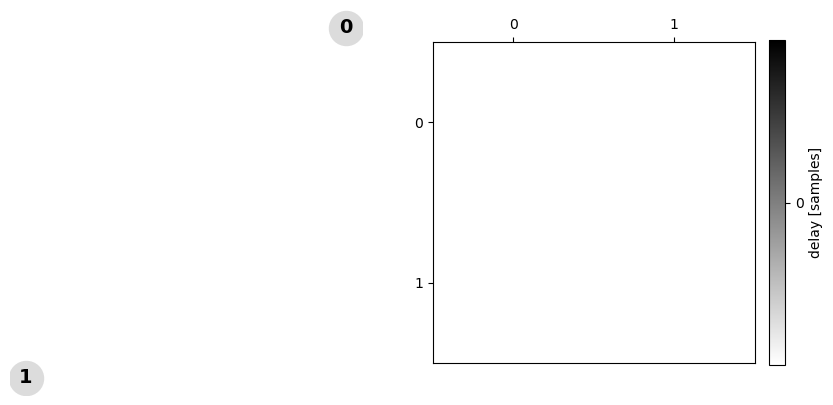

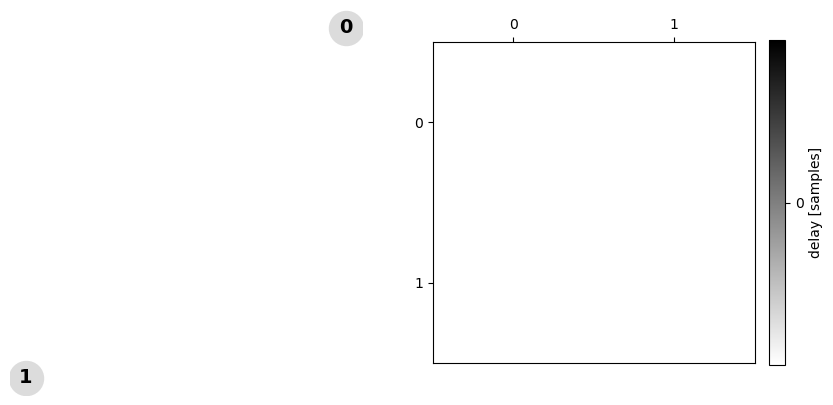

In [17]:
network_analysis = BivariateTE()
settings = {'cmi_estimator': 'JidtGaussianCMI',
            'max_lag': 24,
            'max_lag_sources': 24,
            'min_lag_sources': 1}

# settings = {'cmi_estimator': 'OpenCLKraskovCMI',
#             'max_lag': 24,
#             'max_lag_sources': 24,
#             'min_lag_sources': 1}



geo_slice = geo_data_coarse.groupby('lat')[lat].groupby('lon')[lon].groupby('time.month')
cr_slice = cr.groupby('time.month')
for month in months:
    dataList = [geo_slice[month]['T2MMEAN'].data.reshape(-1), cr_slice[month]['cr'].data]
    idt_data = Data(np.column_stack((itertools.zip_longest(*dataList, fillvalue=0))), dim_order='ps')
    results = network_analysis.analyse_network(settings=settings, data=idt_data, sources=[1], targets=[0])

    results.print_edge_list(weights='max_te_lag', fdr=False)
    plot_network(results=results, weights='max_te_lag', fdr=False)

            

In [18]:
results.get_adjacency_matrix('max_te_lag', fdr=False).print_matrix()

[[False False]
 [False False]]
[[0 0]
 [0 0]]


In [19]:
np.zeros((geo_data_coarse['lon'].shape[0], geo_data_coarse['lat'].shape[0], months.shape[0], 2, 2))

array([[[[[0., 0.],
          [0., 0.]],

         [[0., 0.],
          [0., 0.]],

         [[0., 0.],
          [0., 0.]],

         [[0., 0.],
          [0., 0.]]],


        [[[0., 0.],
          [0., 0.]],

         [[0., 0.],
          [0., 0.]],

         [[0., 0.],
          [0., 0.]],

         [[0., 0.],
          [0., 0.]]],


        [[[0., 0.],
          [0., 0.]],

         [[0., 0.],
          [0., 0.]],

         [[0., 0.],
          [0., 0.]],

         [[0., 0.],
          [0., 0.]]],


        ...,


        [[[0., 0.],
          [0., 0.]],

         [[0., 0.],
          [0., 0.]],

         [[0., 0.],
          [0., 0.]],

         [[0., 0.],
          [0., 0.]]],


        [[[0., 0.],
          [0., 0.]],

         [[0., 0.],
          [0., 0.]],

         [[0., 0.],
          [0., 0.]],

         [[0., 0.],
          [0., 0.]]],


        [[[0., 0.],
          [0., 0.]],

         [[0., 0.],
          [0., 0.]],

         [[0., 0.],
          [0., 0.]],

         

## Run Bivariate analysis with Sunspot number on all latitudes

In [20]:
months = np.fromiter(geo_data_coarse.groupby('time.month').groups.keys(), dtype=int)
initalization = np.zeros((months.shape[0], geo_data_coarse['lat'].shape[0], geo_data_coarse['lon'].shape[0], 2, 2))

sn_causality = xr.Dataset(
    data_vars=dict(
        lag=(['season', 'lat', 'lon', 'source', 'target'], initalization)
    ),
    coords=dict(
        season=months,
        lat=(geo_data_coarse['lat'].data),
        lon=(geo_data_coarse['lon'].data),
        source=np.array([0,1]),
        target=np.array([0,1])
    ),
    attrs=dict(description="Granger causality."),
)
sn_causality

<xarray.Dataset>
Dimensions:  (season: 4, lat: 13, lon: 20, source: 2, target: 2)
Coordinates:
  * season   (season) int32 1 4 7 10
  * lat      (lat) float64 -82.75 -67.75 -52.75 -37.75 ... 67.25 82.25 90.0
  * lon      (lon) float64 -170.9 -152.2 -133.4 -114.7 ... 147.8 166.6 177.8
  * source   (source) int32 0 1
  * target   (target) int32 0 1
Data variables:
    lag      (season, lat, lon, source, target) float64 0.0 0.0 0.0 ... 0.0 0.0
Attributes:
    description:  Granger causality.

In [22]:
network_analysis = BivariateTE()
settings = {'cmi_estimator': 'JidtGaussianCMI',
            'max_lag': 24,
            'max_lag_sources': 24,
            'min_lag_sources': 1,
            'verbose':False}

months = np.fromiter(geo_data_coarse.groupby('time.month').groups.keys(), dtype=int)
sn_slice = sn.groupby('time.month')


for lon in tqdm(geo_data_coarse['lon'].data, desc="Longitude", position=0):
    for lat in tqdm(geo_data_coarse['lat'].data, desc="Latitude", position=1, leave=False):

        geo_slice = geo_data_coarse.groupby('lat')[lat].groupby('lon')[lon].groupby('time.month')
        for month in months:
            dataList = [geo_slice[month]['T2MMEAN'].data.reshape(-1), sn_slice[month]['sn'].data]
            idt_data = Data(np.column_stack((itertools.zip_longest(*dataList, fillvalue=0))), dim_order='ps')
            results = network_analysis.analyse_network(settings=settings, data=idt_data, sources=[1], targets=[0])
            edges = results.get_adjacency_matrix('max_te_lag', fdr=False).get_edge_list()

            if edges.shape[0] > 0:
                for edge in edges:
                    sn_causality['lag'].loc[dict(lon=lon, lat=lat, season=month, source=edge[0], target=edge[1])] = edge[2]
        

Longitude:   0%|          | 0/20 [00:00<?, ?it/s]

Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target 


---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data 


---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data 


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---


---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data 


---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates
selected vars sources [(1, 14)]
s


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates
selected vars sources [(1, 14)]
selected candidates current source: [(1, 10)]

---------------------------- (4) final statistics
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates
selected vars sources [(1, 14)]
selected candidates current source: [(1, 10)]

---------------------------- (4) final statistics
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


---------------------------- (2) include source


---------------------------- (3) prune candidates
selected vars sources [(1, 14)]
selected candidates current source: [(1, 10)]

---------------------------- (4) final statistics
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final stati


---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates
selected vars sources [(1, 9)]
selected candidates current source: [(1, 15)]

---------------


---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data 


---------------------------- (3) prune candidates
selected vars sources [(1, 13)]
selected candidates current source: [(1, 11)]

---------------------------- (4) final statistics
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43


---------------------------- (3) prune candidates
selected vars sources [(1, 14)]
selected candidates current source: [(1, 10)]

---------------------------- (4) final statistics
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates
selected vars sources [(1, 13)]
selected candidates current source: [(1, 11)]

---------------------------- (4) final statistics


Latitude:  85%|████████▍ | 11/13 [00:05<00:01,  1.81it/s]

Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample 


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates
selected vars sources [(1, 5)]
selected candidates current source: [(1, 19)]

---------------------------- (4) final statistics
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

----------------

Longitude:   5%|▌         | 1/20 [00:06<02:07,  6.69s/it]


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...


Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target 


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---


---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data 


---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data 


---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data 


---------------------------- (3) prune candidates
selected vars sources [(1, 8)]
selected candidates current source: [(1, 16)]

---------------------------- (4) final statistics
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 


---------------------------- (3) prune candidates
selected vars sources [(1, 14)]
selected candidates current source: [(1, 10)]

---------------------------- (4) final statistics
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates



---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data 


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---


---------------------------- (4) final statistics
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates



---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...


Latitude:  85%|████████▍ | 11/13 [00:05<00:00,  2.19it/s]

Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates
selected vars sources [(1, 0)]
selected candidates current source: [(1, 24)]

---------------------------- (4) final statistics
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sourc


---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

--

Longitude:  10%|█         | 2/20 [00:12<01:53,  6.29s/it]


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...


Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target 


---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates



---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates
selected vars sources [(1, 18)]
selected candidates current source: [(1, 6)]

---------------------------- (4) final statistics
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statis

Latitude:  15%|█▌        | 2/13 [00:00<00:04,  2.23it/s]

Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


---------------------------- (2) include source candidates

---------------------------- (3) prune candidates
selected vars sources [(1, 16)]
selected candidates current source: [(1, 8)]

---------------------------- (4) final statistics
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates
selected vars sources [(1, 14)]
selected candidates current source: [(1, 10)]

---------------------------- (4) final statistics
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) 


---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data 


---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates
selected vars sources [(1, 18)]
selected candidates current source: [(1, 6)]

---------------------------- (4) final statistics
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates
selected vars sources [(1, 19)]
selected candi


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---


---------------------------- (2) include source candidates

---------------------------- (3) prune candidates
selected vars sources [(1, 9)]
selected candidates current source: [(1, 15)]

---------------------------- (4) final statistics
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) pru


---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...


Latitude:  54%|█████▍    | 7/13 [00:03<00:03,  1.90it/s]

Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


---------------------------- (2) include source candidates

---------------------------- (3) prune candidates
selected vars sources [(1, 15)]
selected candidates current source: [(1, 9)]

---------------------------- (4) final statistics
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates




---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4)


---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing da


---------------------------- (3) prune candidates
selected vars sources [(1, 15)]
selected candidates current source: [(1, 9)]

---------------------------- (4) final statistics
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statis


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---


---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data 

Longitude:  15%|█▌        | 3/20 [00:19<01:47,  6.33s/it]


---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...


Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target 


---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data 


---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates
selected vars sources [(1, 19)]
selected candidates current source: [(1, 5)]

---------------------------- (4) final statistics
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statis


---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data 


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---

Latitude:  31%|███       | 4/13 [00:01<00:03,  2.46it/s]

Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target 


---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates
selected vars sources [(1, 21)]
selected candidates current source: [(1, 3)]

---------------------------- (4) final statistics
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statis


---------------------------- (3) prune candidates
selected vars sources [(1, 9)]
selected candidates current source: [(1, 15)]

---------------------------- (4) final statistics
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 


---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


---------------------------- (2) include source candidates



---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data 


---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 p



No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates
selected vars sources [(1, 19)]
selected candidates current source: [(1, 5)]

---------------------------- (4) final statistics
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates




No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---

Latitude:  85%|████████▍ | 11/13 [00:04<00:00,  2.22it/s]

Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample 



No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

--

Longitude:  20%|██        | 4/20 [00:25<01:39,  6.25s/it]


---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...


Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target 


---------------------------- (3) prune candidates
selected vars sources [(1, 18)]
selected candidates current source: [(1, 6)]

---------------------------- (4) final statistics
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates



---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates
selected vars sources [(1, 18)]
selected candidates current source: [(1, 6)]

---------------

Latitude:  15%|█▌        | 2/13 [00:00<00:04,  2.23it/s]

Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates




No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---


---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data 


---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data 


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates
selected vars sources [(1, 9)]
selected candidates current source: [(1, 15)]

---------------------------- (4) final statistics
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

----------------


---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing da


---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4)


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---


---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing da


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---


---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data 

Longitude:  25%|██▌       | 5/20 [00:31<01:33,  6.26s/it]


---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...


Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates
selected vars sources [(1, 12)]
selected candidates current source: [(1, 12)]

---------------------------- (4) final statistics
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data





No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates
selected vars sources [(1, 17)]
selected candidates current source: [(1, 7)]

---------------------------- (4) final statistics
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---


---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data 


---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data 


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates
selected vars sources [(1, 8)]
selected candidates current source: [(1, 16)]

---------------------------- (4) final statistics
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

----------------


---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing da


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---


---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing da


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---


---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing da


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---


---------------------------- (3) prune candidates
selected vars sources [(1, 11)]
selected candidates current source: [(1, 13)]

---------------------------- (4) final statistics
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final stati

Longitude:  30%|███       | 6/20 [00:38<01:29,  6.39s/it]


---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...


Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample 


---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates
selected vars sources [(1, 17)]
selected candidates current source: [(1, 7)]

---------------------------- (4) final statistics
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates



---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...


Latitude:  15%|█▌        | 2/13 [00:00<00:05,  2.20it/s]

Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target 


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates



---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data 


---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data 


---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data 


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates



---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data 


---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4)

Longitude:  35%|███▌      | 7/20 [00:44<01:21,  6.24s/it]


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...


Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates
selected vars sources [(1, 12)]
selected candidates current source: [(1, 12)]

---------------------------- (4) final statistics
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sour


---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data 


---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...


Latitude:  15%|█▌        | 2/13 [00:00<00:04,  2.40it/s]

Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target 


---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data 


---------------------------- (3) prune candidates
selected vars sources [(1, 15)]
selected candidates current source: [(1, 9)]

---------------------------- (4) final statistics
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statis


---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


---------------------------- (2) include source candidates

---------------------------- (3) prune candidates
selected vars sources [(1, 3)]
selected candidates current source: [(1, 21)]

---------------------------- (4) final statistics
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 


---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data 


---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data 


---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates
selected vars sources [(1, 12)]
selected candidates current source: [(1, 12)]

--------------


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---


---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data 


---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data 

Longitude:  40%|████      | 8/20 [00:49<01:12,  6.08s/it]


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...


Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates
selected vars sources [(1, 11)]
selected candidates current source: [(1, 13)]

---------------------------- (4) final statistics
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sour


---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data 


---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...


Latitude:  15%|█▌        | 2/13 [00:00<00:05,  2.01it/s]

Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target 


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---


---------------------------- (3) prune candidates
selected vars sources [(1, 14)]
selected candidates current source: [(1, 10)]

---------------------------- (4) final statistics
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates



---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...


Latitude:  38%|███▊      | 5/13 [00:02<00:04,  1.99it/s]

Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample 


---------------------------- (3) prune candidates
selected vars sources [(1, 10)]
selected candidates current source: [(1, 14)]

---------------------------- (4) final statistics
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final stati


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---


---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates
selected vars sources [(1, 17)]
selected candidates current source: [(1, 7)]

---------------


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4)


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates



---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...


Latitude:  85%|████████▍ | 11/13 [00:04<00:00,  2.49it/s]

Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target 


---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates


Longitude:  45%|████▌     | 9/20 [00:55<01:05,  6.00s/it]


---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...


Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates
selected vars sources [(1, 11)]
selected candidates current source: [(1, 13)]

---------------------------- (4) final statistics
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sour


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---


---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4)


---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates
selected vars sources [(1, 0), (1, 19)]
selected candidates current source: [(1, 24), (1, 5)]


---------------------------- (3) prune candidates
selected vars sources [(1, 10)]
selected candidates current source: [(1, 14)]

---------------------------- (4) final statistics
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final stati


---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates




No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---

Latitude:  62%|██████▏   | 8/13 [00:03<00:02,  2.08it/s]

Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates



---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...


Latitude:  69%|██████▉   | 9/13 [00:04<00:01,  2.18it/s]

Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target 


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


---------------------------- (2) include source candidates

---------------------------- (3) prune candidates
selected vars sources [(1, 16)]
s


---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data 

Longitude:  50%|█████     | 10/20 [01:01<00:59,  5.99s/it]


---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...


Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


---------------------------- (2) include source candidates

---------------------------- (3) prune candidates
selected vars sources [(1, 23)]
selected candidates current source: [(1, 1)]

---------------------------- (4) final statistics
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

--------------------


---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data 


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---


---------------------------- (3) prune candidates
selected vars sources [(1, 11), (1, 3)]
selected candidates current source: [(1, 13), (1, 21)]

---------------------------- (4) final statistics
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------


---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data 


---------------------------- (3) prune candidates
selected vars sources [(1, 19), (1, 12)]
selected candidates current source: [(1, 5), (1, 12)]

---------------------------- (4) final statistics
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------


---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates
selected vars sources [(1, 19)]
selected candidates current source: [(1, 5)]

---------------------------- (4) final statistics
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statis


---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing da


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates
selected vars sources [(1, 2)]
selected candidates current source: [(1, 22)]

---------------------------- (4) final statistics
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates




No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---

Longitude:  55%|█████▌    | 11/20 [01:08<00:57,  6.34s/it]


---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...


Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target 


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates
selected vars sources [(1, 15)]
selected candidates current source: [(1, 9)]

---------------------------- (4) final statistics
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...


Latitude:   8%|▊         | 1/13 [00:00<00:05,  2.33it/s]

Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target 


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates
selected vars sources [(1, 17)]
selected candidates current source: [(1, 7)]

---------------------------- (4) final statistics
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

----------------


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...


Latitude:  23%|██▎       | 3/13 [00:01<00:04,  2.12it/s]

Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates
selected vars sources [(1, 0)]
selected candidates current source: [(1, 24)]

---------------------------- (4) final statistics
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

-


---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 p


---------------------------- (3) prune candidates
selected vars sources [(1, 14)]
selected candidates current source: [(1, 10)]

---------------------------- (4) final statistics
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final stati


---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data 


---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data 


---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data 


---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data 


---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates
selected vars sources [(1, 2)]
se


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---

Longitude:  60%|██████    | 12/20 [01:14<00:48,  6.11s/it]


---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...


Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target 


---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data 


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates



---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data 


---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data 


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---


---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data 


---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing da


---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data 


---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data 


---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data 


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates



---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data 

Longitude:  65%|██████▌   | 13/20 [01:19<00:40,  5.76s/it]


---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...


Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates




---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4)

Latitude:   8%|▊         | 1/13 [00:00<00:05,  2.37it/s]

Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


---------------------------- (2) include source candidates

---------------------------- (3) prune candidates
selected vars sources [(1, 17)]
selected candidates current source: [(1, 7)]

---------------------------- (4) final statistics
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sourc


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---


---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

--


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4)


---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing da


---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data 


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---


---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data 


---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data 


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---

Longitude:  70%|███████   | 14/20 [01:24<00:33,  5.59s/it]


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...


Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample 


---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...


Latitude:   8%|▊         | 1/13 [00:00<00:05,  2.31it/s]

Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target 


---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates
selected vars sources [(1, 3)]
selected candidates current source: [(1, 21)]

---------------


---------------------------- (2) include source candidates

---------------------------- (3) prune candidates
selected vars sources [(1, 17)]
selected candidates current source: [(1, 7)]

---------------------------- (4) final statistics
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...


Latitude:  23%|██▎       | 3/13 [00:01<00:04,  2.14it/s]

Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target 


---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates
selected vars sources [(1, 6)]
selected candidates current source: [(1, 18)]

---------------


---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data 


---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4)


---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates



---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data 


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---


---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data 


---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data 

Longitude:  75%|███████▌  | 15/20 [01:29<00:26,  5.39s/it]


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---

Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates



---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data 


---------------------------- (2) include source candidates

---------------------------- (3) prune candidates
selected vars sources [(1, 11)]
selected candidates current source: [(1, 13)]

---------------------------- (4) final statistics
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) pr


---------------------------- (3) prune candidates
selected vars sources [(1, 9)]
selected candidates current source: [(1, 15)]

---------------------------- (4) final statistics
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates
selected vars sources [(1, 2)]
selected candidates current source: [(1, 22)]

---------------------------- (4) final statistics
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target 


---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data 


---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data 


---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates
selected vars sources [(1, 0)]
selected candidates current source: [(1, 24)]

---------------


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---


---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data 


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...


Longitude:  80%|████████  | 16/20 [01:34<00:21,  5.37s/it][A

Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target 


---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates
selected vars sources [(1, 20)]
s


---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates
selected vars sources [(1, 14)]
selected candidates current source: [(1, 10)]

--------------


---------------------------- (3) prune candidates
selected vars sources [(1, 22)]
selected candidates current source: [(1, 2)]

---------------------------- (4) final statistics
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statis


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---


---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing da


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---


---------------------------- (2) include source candidates

---------------------------- (3) prune candidates
selected vars sources [(1, 19), (1, 13)]
selected candidates current source: [(1, 5), (1, 11)]

---------------------------- (4) final statistics
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

------------------


---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates
selected vars sources [(1, 12)]
selected candidates current source: [(1, 12)]

--------------


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---


---------------------------- (3) prune candidates
selected vars sources [(1, 21)]
selected candidates current source: [(1, 3)]

---------------------------- (4) final statistics
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statis


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates


Longitude:  85%|████████▌ | 17/20 [01:40<00:16,  5.43s/it]


---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...


Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target 


---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...


Latitude:   8%|▊         | 1/13 [00:00<00:04,  2.62it/s]

Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target 


---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data 


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates



---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...


Latitude:  31%|███       | 4/13 [00:01<00:03,  2.26it/s]

Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target 


---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 p


---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing da


---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates
selected vars sources [(1, 11)]
selected candidates current source: [(1, 13)]

---------------------------- (4) f


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates
selected vars sources [(1, 23)]
selected candidates current source: [(1, 1)]

---------------------------- (4) final statistics
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

----------------


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates
selected vars sources [(1, 11)]
selected candidates current source: [(1, 13)]

---------------------------- (4) final statistics
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------

Longitude:  90%|█████████ | 18/20 [01:46<00:11,  5.58s/it]


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...


Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target 


---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data 


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---

Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target 


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---


---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates
selected vars sources [(1, 14)]
s


---------------------------- (3) prune candidates
selected vars sources [(1, 22)]
selected candidates current source: [(1, 2)]

---------------------------- (4) final statistics
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates
selected vars sources [(1, 14)]
selected candi


---------------------------- (3) prune candidates
selected vars sources [(1, 14)]
selected candidates current source: [(1, 10)]

---------------------------- (4) final statistics
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates



---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data 


---------------------------- (3) prune candidates
selected vars sources [(1, 8)]
selected candidates current source: [(1, 16)]

---------------------------- (4) final statistics
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statis


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates
selected vars sources [(1, 1)]
selected candidates current source: [(1, 23)]

---------------------------- (4) final statistics
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) pru


---------------------------- (3) prune candidates
selected vars sources [(1, 11)]
selected candidates current source: [(1, 13)]

---------------------------- (4) final statistics
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final stati

Longitude:  95%|█████████▌| 19/20 [01:52<00:05,  5.67s/it]


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...


Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target 


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---


---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data 


---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data 


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


---------------------------- (2) include source candidates

---------------------------- (3) prune candidates
selected vars sources [(1, 14)]
selected candidates current source: [(1, 10)]

---------------------------- (4) final statistics
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) pr


---------------------------- (3) prune candidates
selected vars sources [(1, 14)]
selected candidates current source: [(1, 10)]

---------------------------- (4) final statistics
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates
selected vars sources [(1, 14)]
selected candidates current source: [(1, 10)]

---------------------------- (4) final statistics
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidat


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates
selected vars sources [(1, 14)]
selected candidates current source: [(1, 10)]

---------------------------- (4) final statistics


Latitude:  54%|█████▍    | 7/13 [00:02<00:02,  2.17it/s]

Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample 


---------------------------- (2) include source candidates

---------------------------- (3) prune candidates
selected vars sources [(1, 14)]
selected candidates current source: [(1, 10)]

---------------------------- (4) final statistics
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) pr


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates



---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data 


---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates



---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates
selected vars sources [(1, 5)]
selected candidates current source: [(1, 19)]

---------------

Longitude: 100%|██████████| 20/20 [01:57<00:00,  5.87s/it]


---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...


### Plot sensitive candidates

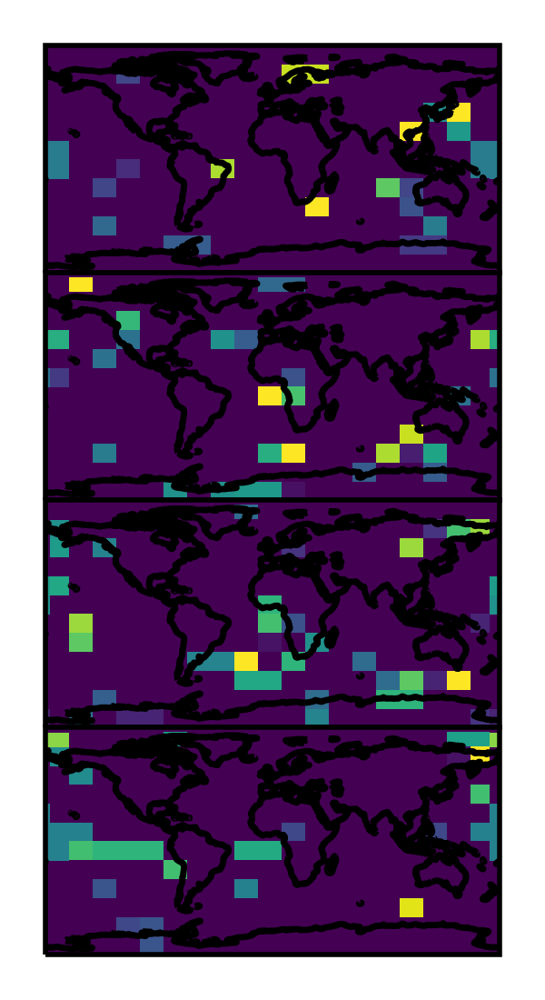

In [23]:
vmin = 0
vmax = 12
source=1
target=0

fig = plt.figure(figsize=2*np.array([2, 1]), dpi=500)
gs0 = fig.add_gridspec(4, 1, wspace=0.0, hspace=0, left=0, right=1, bottom=0, top=1)

ax = fig.add_subplot(gs0[0, 0], projection=ccrs.PlateCarree())
sn_causality.lag.loc[dict(season=1, source=source, target=target)].plot(ax=ax, add_colorbar=False, add_labels=False)
ax.coastlines(color='k')

ax = fig.add_subplot(gs0[1, 0], projection=ccrs.PlateCarree())
sn_causality.lag.loc[dict(season=4, source=source, target=target)].plot(ax=ax, add_colorbar=False, add_labels=False)
ax.coastlines(color='k')

ax = fig.add_subplot(gs0[2, 0], projection=ccrs.PlateCarree())
sn_causality.lag.loc[dict(season=7, source=source, target=target)].plot(ax=ax, add_colorbar=False, add_labels=False)
ax.coastlines(color='k')

ax = fig.add_subplot(gs0[3, 0], projection=ccrs.PlateCarree())
sn_causality.lag.loc[dict(season=10, source=source, target=target)].plot(ax=ax, add_colorbar=False, add_labels=False)
ax.coastlines(color='k')

In [24]:
sn_causality

<xarray.Dataset>
Dimensions:  (season: 4, lat: 13, lon: 20, source: 2, target: 2)
Coordinates:
  * season   (season) int32 1 4 7 10
  * lat      (lat) float64 -82.75 -67.75 -52.75 -37.75 ... 67.25 82.25 90.0
  * lon      (lon) float64 -170.9 -152.2 -133.4 -114.7 ... 147.8 166.6 177.8
  * source   (source) int32 0 1
  * target   (target) int32 0 1
Data variables:
    lag      (season, lat, lon, source, target) float64 0.0 0.0 0.0 ... 0.0 0.0
Attributes:
    description:  Granger causality.

In [25]:
lag = sn_causality.lag
winter = lag.loc[dict(season=1, source=source, target=target)].squeeze()
spring = lag.loc[dict(season=4, source=source, target=target)].squeeze()
summer = lag.loc[dict(season=7, source=source, target=target)].squeeze()
fall = lag.loc[dict(season=10, source=source, target=target)].squeeze()

all_year = winter.where(np.logical_and(np.logical_and(np.logical_and(winter>0, spring>0), summer>0), fall>0))
all_year_stack = all_year.stack(notnull=['lat','lon']) 
all_year_stack = all_year_stack[all_year_stack.notnull()]

all_year_stack

<xarray.DataArray 'lag' (notnull: 1)>
array([10.])
Coordinates:
    season   int32 1
    source   int32 1
    target   int32 0
  * notnull  (notnull) object MultiIndex
  * lat      (notnull) float64 7.25
  * lon      (notnull) float64 177.8

(3666.0, 19281.0)

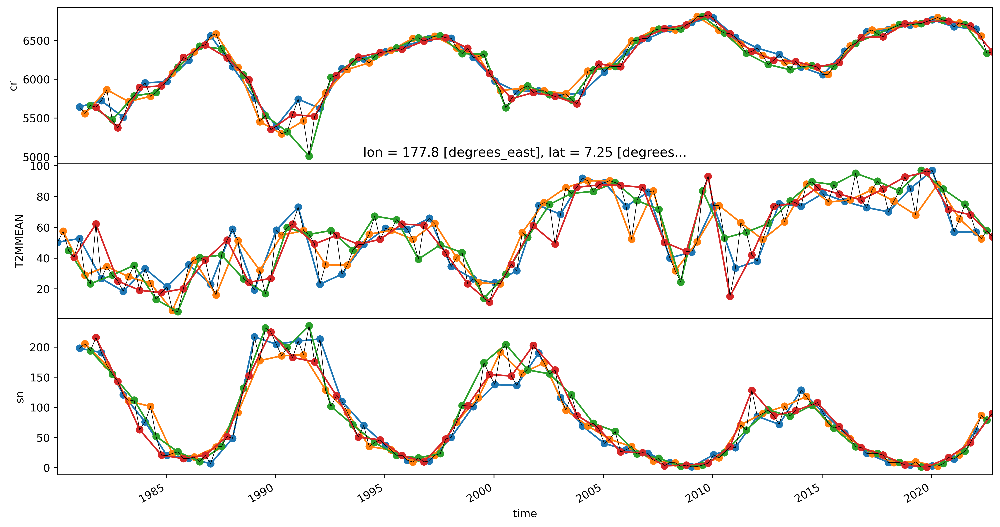

In [26]:
months = np.fromiter(geo_data_coarse.groupby('time.month').groups.keys(), dtype=int)
month = np.random.choice(months)
lat = all_year_stack.lat.data[0]
lon = all_year_stack.lon.data[0]


fig = plt.figure(figsize=2*np.array([6, 3]), dpi=500)
gs0 = fig.add_gridspec(3, 1, wspace=0.15, hspace=0, left=0, right=1, bottom=0, top=1)


ax = fig.add_subplot(gs0[0, 0])
cr_slice = cr.groupby('time.month')
for month in months:  
    cr_slice[month]['cr'].plot(ax=ax, marker='o')

cr['cr'].plot(ax=ax, c='k', lw=0.5)
ax.set_xlim([np.min(geo_data_coarse.time.data), np.max(geo_data_coarse.time.data)])



ax = fig.add_subplot(gs0[1, 0])

geo_slice = geo_data_coarse.groupby('lat')[lat].groupby('lon')[lon].groupby('time.month')
for month in months:
    geo_slice[month]['T2MMEAN'].plot(ax=ax, marker='o')

geo_data_coarse['T2MMEAN'].groupby('lat')[lat].groupby('lon')[lon].plot(ax=ax, c='k', lw=0.5)
ax.set_xlim([np.min(geo_data_coarse.time.data), np.max(geo_data_coarse.time.data)])


ax = fig.add_subplot(gs0[2, 0])
sn_slice = sn.groupby('time.month')
for month in months:  
    sn_slice[month]['sn'].plot(ax=ax, marker='o')

sn['sn'].plot(ax=ax, c='k', lw=0.5)
ax.set_xlim([np.min(geo_data_coarse.time.data), np.max(geo_data_coarse.time.data)])

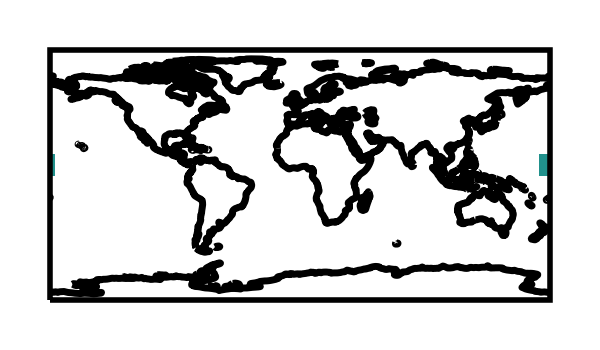

In [27]:
vmin = 0
vmax = 12
source=1
target=0

fig = plt.figure(figsize=2*np.array([2, 1]), dpi=500)
gs0 = fig.add_gridspec(4, 1, wspace=0.0, hspace=0, left=0, right=1, bottom=0, top=1)

ax = fig.add_subplot(gs0[0, 0], projection=ccrs.PlateCarree())
all_year.plot(ax=ax, add_colorbar=False, add_labels=False)
ax.coastlines(color='k')

### Plot random candidate sequence

In [28]:
# Find non-zero lags and associated coordinates
lag = sn_causality.lag
winter = lag.loc[dict(season=1, source=source, target=target)].squeeze()
winter = winter.where(winter>0)

winter_stacked = winter.stack(notnull=['lat','lon']) 
winter_non_zero = winter_stacked[winter_stacked.notnull()]

(3666.0, 19281.0)

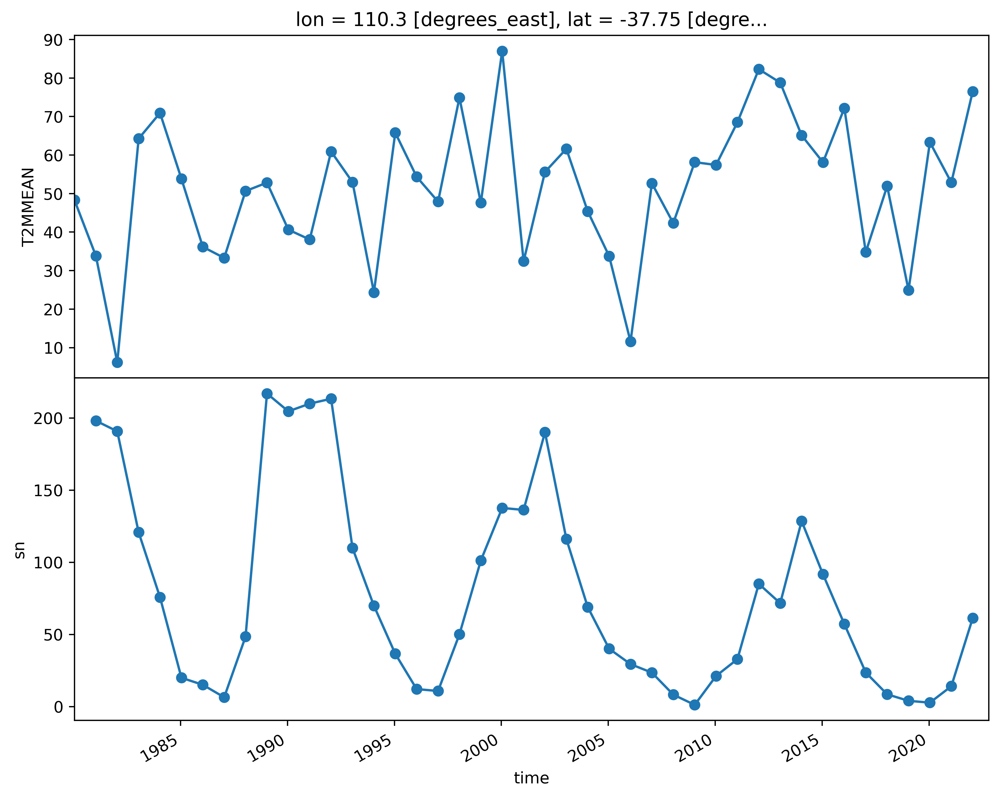

In [29]:
month = 1
rand_index = np.random.randint(0, winter_non_zero.lat.shape[0]-1)
lat = winter_non_zero.lat.data[rand_index]
lon = winter_non_zero.lon.data[rand_index]


fig = plt.figure(figsize=2*np.array([4, 3]), dpi=500)
gs0 = fig.add_gridspec(2, 1, wspace=0.15, hspace=0, left=0, right=1, bottom=0, top=1)


ax = fig.add_subplot(gs0[0, 0])

geo_slice = geo_data_coarse.groupby('lat')[lat].groupby('lon')[lon].groupby('time.month')
geo_slice[month]['T2MMEAN'].plot(ax=ax, marker='o')

ax.set_xlim([np.min(geo_data_coarse.time.data), np.max(geo_data_coarse.time.data)])


ax = fig.add_subplot(gs0[1, 0])
sn_slice = sn.groupby('time.month')
sn_slice[month]['sn'].plot(ax=ax, marker='o')

ax.set_xlim([np.min(geo_data_coarse.time.data), np.max(geo_data_coarse.time.data)])

## Run Bivariate analysis with cosmic rays on all latitudes

In [30]:
months = np.fromiter(geo_data_coarse.groupby('time.month').groups.keys(), dtype=int)
initalization = np.zeros((months.shape[0], geo_data_coarse['lat'].shape[0], geo_data_coarse['lon'].shape[0], 2, 2))

cr_causality = xr.Dataset(
    data_vars=dict(
        lag=(['season', 'lat', 'lon', 'source', 'target'], initalization)
    ),
    coords=dict(
        season=months,
        lat=(geo_data_coarse['lat'].data),
        lon=(geo_data_coarse['lon'].data),
        source=np.array([0,1]),
        target=np.array([0,1])
    ),
    attrs=dict(description="Granger causality."),
)
cr_causality

<xarray.Dataset>
Dimensions:  (season: 4, lat: 13, lon: 20, source: 2, target: 2)
Coordinates:
  * season   (season) int32 1 4 7 10
  * lat      (lat) float64 -82.75 -67.75 -52.75 -37.75 ... 67.25 82.25 90.0
  * lon      (lon) float64 -170.9 -152.2 -133.4 -114.7 ... 147.8 166.6 177.8
  * source   (source) int32 0 1
  * target   (target) int32 0 1
Data variables:
    lag      (season, lat, lon, source, target) float64 0.0 0.0 0.0 ... 0.0 0.0
Attributes:
    description:  Granger causality.

In [31]:
network_analysis = BivariateTE()
settings = {'cmi_estimator': 'JidtGaussianCMI',
            'max_lag': 24,
            'max_lag_sources': 24,
            'min_lag_sources': 1,
            'verbose':False}

months = np.fromiter(geo_data_coarse.groupby('time.month').groups.keys(), dtype=int)
cr_slice = cr.groupby('time.month')


for lon in tqdm(geo_data_coarse['lon'].data, desc="Longitude", position=0):
    for lat in tqdm(geo_data_coarse['lat'].data, desc="Latitude", position=1, leave=False):

        geo_slice = geo_data_coarse.groupby('lat')[lat].groupby('lon')[lon].groupby('time.month')
        for month in months:
            dataList = [geo_slice[month]['T2MMEAN'].data.reshape(-1), cr_slice[month]['cr'].data]
            idt_data = Data(np.column_stack((itertools.zip_longest(*dataList, fillvalue=0))), dim_order='ps')
            results = network_analysis.analyse_network(settings=settings, data=idt_data, sources=[1], targets=[0])
            edges = results.get_adjacency_matrix('max_te_lag', fdr=False).get_edge_list()

            if edges.shape[0] > 0:
                for edge in edges:
                    cr_causality['lag'].loc[dict(lon=lon, lat=lat, season=month, source=edge[0], target=edge[1])] = edge[2]
        

Longitude:   0%|          | 0/20 [00:00<?, ?it/s]

Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target 


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---


---------------------------- (3) prune candidates
selected vars sources [(1, 9)]
selected candidates current source: [(1, 15)]

---------------------------- (4) final statistics
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statis


---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data 


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---

Latitude:  31%|███       | 4/13 [00:01<00:03,  2.42it/s]

Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target 


---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates
selected vars sources [(1, 8)]
selected candidates current source: [(1, 16)]

---------------------------- (4) final statistics
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statis


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates
selected vars sources [(1, 15)]
selected candidates current source: [(1, 9)]

---------------------------- (4) final statistics
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

----------------


---------------------------- (3) prune candidates
selected vars sources [(1, 15)]
selected candidates current source: [(1, 9)]

---------------------------- (4) final statistics
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statis


---------------------------- (3) prune candidates
selected vars sources [(1, 13)]
selected candidates current source: [(1, 11)]

---------------------------- (4) final statistics
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final stati


---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

--


---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4)


---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing da


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates
selected vars sources [(1, 1)]
selected candidates current source: [(1, 23)]

---------------------------- (4) final statistics
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

----------------

Longitude:   5%|▌         | 1/20 [00:05<01:51,  5.88s/it]


---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...


Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target 


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---


---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates
selected vars sources [(1, 12)]
selected candidates current source: [(1, 12)]

--------------


---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates
selected vars sources [(1, 8)]
selected candidates current source: [(1, 16)]

---------------------------- (4) final statistics
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statis


---------------------------- (2) include source candidates

---------------------------- (3) prune candidates
selected vars sources [(1, 8)]
selected candidates current source: [(1, 16)]

---------------------------- (4) final statistics
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in fin


---------------------------- (3) prune candidates
selected vars sources [(1, 15)]
selected candidates current source: [(1, 9)]

---------------------------- (4) final statistics
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates
selected vars sources [(1, 15)]
selected candidates current source: [(1, 9)]

---------------------------- (4) final statistics
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates


---------------------------- (3) prune candidates
selected vars sources [(1, 2)]
selected candidates current source: [(1, 22)]

---------------------------- (4) final statistics
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statis


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---

Latitude:  69%|██████▉   | 9/13 [00:04<00:01,  2.17it/s]

Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates




No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---

Latitude:  77%|███████▋  | 10/13 [00:04<00:01,  2.26it/s]

Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates



---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data 


---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates
selected vars sources [(1, 1)]
selected candidates current source: [(1, 23)]

---------------------------- (4) final statistics
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statis

Longitude:  10%|█         | 2/20 [00:11<01:46,  5.93s/it]


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...


Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target 


---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing da


---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing da


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---


---------------------------- (3) prune candidates
selected vars sources [(1, 20)]
selected candidates current source: [(1, 4)]

---------------------------- (4) final statistics
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates



---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data 


---------------------------- (3) prune candidates
selected vars sources [(1, 9)]
selected candidates current source: [(1, 15)]

---------------------------- (4) final statistics
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


---------------------------- (2) include source candidates

---------------------------- (3) prune candidates
selected vars sources [(1, 22)]
selected candidates current source: [(1, 2)]

---------------------------- (4) final statistics


Latitude:  46%|████▌     | 6/13 [00:02<00:03,  2.13it/s]

Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target 


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...


Latitude:  54%|█████▍    | 7/13 [00:03<00:02,  2.17it/s]

Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


---------------------------- (2) include source candidates

---------------------------- (3) prune candidates
selected vars sources [(1, 15)]
selected candidates current source: [(1, 9)]

---------------------------- (4) final statistics
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

--------------------


---------------------------- (3) prune candidates
selected vars sources [(1, 15)]
selected candidates current source: [(1, 9)]

---------------------------- (4) final statistics
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statis


---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data 


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---


---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing da


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---

Longitude:  15%|█▌        | 3/20 [00:17<01:38,  5.81s/it]


---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...


Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target 


---------------------------- (3) prune candidates
selected vars sources [(1, 7)]
selected candidates current source: [(1, 17)]

---------------------------- (4) final statistics
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statis


---------------------------- (3) prune candidates
selected vars sources [(1, 7), (1, 0)]
selected candidates current source: [(1, 17), (1, 24)]

---------------------------- (4) final statistics
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties:


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---


---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data 


---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates
selected vars sources [(1, 22)]
s


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates



---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data 



No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

--


---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates



---------------------------- (3) prune candidates
selected vars sources [(1, 4)]
selected candidates current source: [(1, 20)]

---------------------------- (4) final statistics
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statis


---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing da


---------------------------- (3) prune candidates
selected vars sources [(1, 1)]
selected candidates current source: [(1, 23)]

---------------------------- (4) final statistics
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statis

Longitude:  20%|██        | 4/20 [00:23<01:31,  5.71s/it]


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...


Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target 

Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target 


---------------------------- (3) prune candidates
selected vars sources [(1, 7)]
selected candidates current source: [(1, 17)]

---------------------------- (4) final statistics
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- 


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---


---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data 


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates
selected vars sources [(1, 10)]
selected candidates current source: [(1, 14)]

---------------------------- (4) final statistics
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------


---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data 


---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4)


---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data 


---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


---------------------------- (2) include source candidates



---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates
selected vars sources [(1, 2)]
selected candidates current source: [(1, 22)]

---------------

Latitude:  85%|████████▍ | 11/13 [00:04<00:00,  2.33it/s]

Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates



---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data 

Longitude:  25%|██▌       | 5/20 [00:28<01:25,  5.69s/it]


---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...


Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target 


---------------------------- (3) prune candidates
selected vars sources [(1, 21)]
selected candidates current source: [(1, 3)]

---------------------------- (4) final statistics
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates
selected vars sources [(1, 6)]
selected candidates current source: [(1, 18)]

---------------------------- (4) final statistics
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates


---------------------------- (3) prune candidates
selected vars sources [(1, 11)]
selected candidates current source: [(1, 13)]

---------------------------- (4) final statistics
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...


Latitude:  15%|█▌        | 2/13 [00:00<00:05,  2.13it/s]

Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates



---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data 


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---


---------------------------- (3) prune candidates
selected vars sources [(1, 8)]
selected candidates current source: [(1, 16)]

---------------------------- (4) final statistics
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statis


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4)


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---


---------------------------- (3) prune candidates
selected vars sources [(1, 15)]
selected candidates current source: [(1, 9)]

---------------------------- (4) final statistics
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statis


---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data 


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---


---------------------------- (3) prune candidates
selected vars sources [(1, 11)]
selected candidates current source: [(1, 13)]

---------------------------- (4) final statistics
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final stati

Longitude:  30%|███       | 6/20 [00:34<01:18,  5.60s/it]


---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...


Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample 


---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates
selected vars sources [(1, 17)]
selected candidates current source: [(1, 7)]

---------------------------- (4) final statistics
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statis


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---


---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates
selected vars sources [(1, 1)]
selected candidates current source: [(1, 23)]

---------------


---------------------------- (3) prune candidates
selected vars sources [(1, 15)]
selected candidates current source: [(1, 9)]

---------------------------- (4) final statistics
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...


Latitude:  31%|███       | 4/13 [00:01<00:03,  2.57it/s]

Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target 


---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates
selected vars sources [(1, 15)]
selected candidates current source: [(1, 9)]

---------------


---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data 


---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data 


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---


---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data 


---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates
selected vars sources [(1, 2)]
selected candidates current source: [(1, 22)]

---------------


---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data 


---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates



Longitude:  35%|███▌      | 7/20 [00:39<01:11,  5.47s/it]


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---

Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample 


---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data 


---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data 


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---


---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing da


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---


---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data 


---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates
selected vars sources [(1, 13)]
selected candidates current source: [(1, 11)]

--------------


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---


---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data 


---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data 


---------------------------- (3) prune candidates
selected vars sources [(1, 13)]
selected candidates current source: [(1, 11)]

---------------------------- (4) final statistics
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final stati

Longitude:  40%|████      | 8/20 [00:44<01:03,  5.33s/it]


---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...


Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates
selected vars sources [(1, 0), (1, 14)]
selected candidates current source: [(1, 24), (1, 10)]

---------------------------- (4) final statistics
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No


---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data 


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---


---------------------------- (3) prune candidates
selected vars sources [(1, 13)]
selected candidates current source: [(1, 11)]

---------------------------- (4) final statistics
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final stati


---------------------------- (3) prune candidates
selected vars sources [(1, 15)]
selected candidates current source: [(1, 9)]

---------------------------- (4) final statistics
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates
selected vars sources [(1, 0)]
selected candid


---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates
selected vars sources [(1, 0)]
selected candidates current source: [(1, 24)]

---------------------------- (4) fi


---------------------------- (3) prune candidates
selected vars sources [(1, 0)]
selected candidates current source: [(1, 24)]

---------------------------- (4) final statistics
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statis


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---


---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing da


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4)


---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data 


---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data 


---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing da

Longitude:  45%|████▌     | 9/20 [00:49<00:58,  5.35s/it]


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...


Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates
selected vars sources [(1, 1)]
selected candidates current source: [(1, 23)]

---------------------------- (4) final statistics
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sourc


---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data 


---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...


Latitude:  15%|█▌        | 2/13 [00:00<00:04,  2.45it/s]

Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates
selected vars sources [(1, 10)]
selected candidates current source: [(1, 14)]

---------------------------- (4) final statistics
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data




---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data 


---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing da


---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates
selected vars sources [(1, 0)]
se


---------------------------- (3) prune candidates
selected vars sources [(1, 11)]
selected candidates current source: [(1, 13)]

---------------------------- (4) final statistics
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates



---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates
selected vars sources [(1, 1)]
selected candidates current source: [(1, 23)]

---------------------------- (4) final statistics
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statis

Latitude:  54%|█████▍    | 7/13 [00:03<00:02,  2.28it/s]

Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates



---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data 


---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data 


---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

--

Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target 


---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing da

Longitude:  50%|█████     | 10/20 [00:55<00:54,  5.46s/it]


---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...


Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


---------------------------- (2) include source candidates



---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data 


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...


Latitude:  23%|██▎       | 3/13 [00:01<00:05,  1.79it/s]

Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target 



No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

--


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates
selected vars sources [(1, 8)]
selected candidates current source: [(1, 16)]

---------------------------- (4) final statistics
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

----------------


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates
selected vars sources [(1, 19)]
s


---------------------------- (3) prune candidates
selected vars sources [(1, 20), (1, 3)]
selected candidates current source: [(1, 4), (1, 21)]

---------------------------- (4) final statistics
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

----------------------------


---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing da


---------------------------- (3) prune candidates
selected vars sources [(1, 10)]
selected candidates current source: [(1, 14)]

---------------------------- (4) final statistics
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates
selected vars sources [(1, 2)]
selected candi


---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates
selected vars sources [(1, 2)]
selected candidates current source: [(1, 22)]

---------------------------- (4) final statistics
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statis


---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data 


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---

Longitude:  55%|█████▌    | 11/20 [01:03<00:57,  6.34s/it]


---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...


Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target 


---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates



---------------------------- (3) prune candidates
selected vars sources [(1, 13)]
selected candidates current source: [(1, 11)]

---------------------------- (4) final statistics
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final stati


---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data 


---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data 


---------------------------- (3) prune candidates
selected vars sources [(1, 14)]
selected candidates current source: [(1, 10)]

---------------------------- (4) final statistics
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final stati


---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data 


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---


---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data 


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---


---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates
selected vars sources [(1, 2)]
se


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---


---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates



---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...


Longitude:  60%|██████    | 12/20 [01:09<00:49,  6.14s/it][A

Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target 


---------------------------- (3) prune candidates
selected vars sources [(1, 5)]
selected candidates current source: [(1, 19)]

---------------------------- (4) final statistics
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statis


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates



---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data 


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates
selected vars sources [(1, 8)]
selected candidates current source: [(1, 16)]

---------------------------- (4) final statistics
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

----------------


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---


---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data 


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---

Latitude:  69%|██████▉   | 9/13 [00:03<00:01,  2.64it/s]

Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates
selected vars sources [(1, 13)]
selected candidates current source: [(1, 11)]

---------------------------- (4) final statistics
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data




---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data 


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---

Longitude:  65%|██████▌   | 13/20 [01:14<00:41,  5.91s/it]


---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...


Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample 


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4)


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---


---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data 


---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data 


---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...


Latitude:  38%|███▊      | 5/13 [00:02<00:03,  2.63it/s]

Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target 


---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4)


---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates



---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data 


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---


---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data 


---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data 


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---

Longitude:  70%|███████   | 14/20 [01:20<00:34,  5.71s/it][A

Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample 


---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data 


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates
selected vars sources [(1, 11)]
selected candidates current source: [(1, 13)]

---------------------------- (4) final statistics
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------


---------------------------- (2) include source candidates

---------------------------- (3) prune candidates
selected vars sources [(1, 0), (1, 5)]
selected candidates current source: [(1, 24), (1, 19)]

---------------------------- (4) final statistics
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...


Latitude:  23%|██▎       | 3/13 [00:01<00:04,  2.10it/s]

Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target 



No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

--


---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data 


---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data 


---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing da


---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data 


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---


---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data 


---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data 

Longitude:  75%|███████▌  | 15/20 [01:25<00:27,  5.53s/it]


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...


Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target 


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---


---------------------------- (3) prune candidates
selected vars sources [(1, 13)]
selected candidates current source: [(1, 11)]

---------------------------- (4) final statistics
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final stati


---------------------------- (3) prune candidates
selected vars sources [(1, 16)]
selected candidates current source: [(1, 8)]

---------------------------- (4) final statistics
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates
selected vars sources [(1, 7)]
selected candid


---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates
selected vars sources [(1, 20)]
selected candidates current source: [(1, 4)]

---------------


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---



No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...


Latitude:  46%|████▌     | 6/13 [00:02<00:03,  2.28it/s]

Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target 


---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates
selected vars sources [(1, 0)]
se


---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data 

Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates
selected vars sources [(1, 2)]
selected candidates current source: [(1, 22)]

---------------------------- (4) final statistics
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

-

Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target 


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---

Latitude:  92%|█████████▏| 12/13 [00:04<00:00,  2.60it/s]

Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target 

Longitude:  80%|████████  | 16/20 [01:30<00:21,  5.48s/it]



No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...


Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target 


---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates
selected vars sources [(1, 19), (1, 8)]
selected candidates current source: [(1, 5), (1, 16)]


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates
selected vars sources [(1, 4)]
selected candidates current source: [(1, 20)]

---------------------------- (4) final statistics
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

----------------

Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target 

Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target 


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates



---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data 


---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates
selected vars sources [(1, 12)]
selected candidates current source: [(1, 12)]

---------------------------- (4) final statistics
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) pr


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates
selected vars sources [(1, 13)]
selected candidates current source: [(1, 11)]

---------------------------- (4) final statistics
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------


---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data 


---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing da


---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates



---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...


Latitude:  92%|█████████▏| 12/13 [00:05<00:00,  2.03it/s]

Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates



---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...


Longitude:  85%|████████▌ | 17/20 [01:36<00:17,  5.72s/it][A

Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target 


---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data 


---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data 


---------------------------- (3) prune candidates
selected vars sources [(1, 22)]
selected candidates current source: [(1, 2)]

---------------------------- (4) final statistics
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statis


---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates
selected vars sources [(1, 15)]
selected candidates current source: [(1, 9)]

---------------------------- (4) final statistics
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates
selected vars sources [(1, 15)]
selected candi


---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing da


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4)


---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


---------------------------- (2) include source candidates

---------------------------- (3) prune candidates
selected vars sources [(1, 6)]
selected candidates current source: [(1, 18)]

---------------------------- (4) final statistics
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- 


---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates
selected vars sources [(1, 0), (1


---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data 


---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data 


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates
selected vars sources [(1, 12)]
selected candidates current source: [(1, 12)]

---------------------------- (4) final statistics
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates
selected vars sources [(1, 1)]
selected candidates current source: [(1, 23)]

---------------------------- (4) final statistics
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates




No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---

Longitude:  90%|█████████ | 18/20 [01:43<00:12,  6.02s/it][A

Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target 


---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data 


---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data 


---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data 


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---


---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...


Latitude:  38%|███▊      | 5/13 [00:02<00:03,  2.10it/s]

Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates
selected vars sources [(1, 15)]
selected candidates current source: [(1, 9)]

---------------------------- (4) final statistics
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

-


---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates
selected vars sources [(1, 15)]
selected candidates current source: [(1, 9)]

---------------------------- (4) final statistics
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statis


---------------------------- (3) prune candidates
selected vars sources [(1, 15)]
selected candidates current source: [(1, 9)]

---------------------------- (4) final statistics
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statis


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---


---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates
selected vars sources [(1, 9)]
selected candidates current source: [(1, 15)]

---------------------------- (4) final statistics
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statis


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---


---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates
selected vars sources [(1, 6)]
selected candidates current source: [(1, 18)]

---------------------------- (4) final statistics


Latitude:  85%|████████▍ | 11/13 [00:05<00:01,  1.97it/s]

Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample 


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates
selected vars sources [(1, 1)]
selected candidates current source: [(1, 23)]

---------------------------- (4) final statistics
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

----------------

Longitude:  95%|█████████▌| 19/20 [01:50<00:06,  6.18s/it]


---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...


Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target 


---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data 


---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...


Latitude:  15%|█▌        | 2/13 [00:00<00:04,  2.39it/s]

Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target 


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---


---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data 


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


---------------------------- (2) include source candidates

---------------------------- (3) prune candidates
selected vars sources [(1, 8)]
selected candidates current source: [(1, 16)]

---------------------------- (4) final statistics
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) pru


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates
selected vars sources [(1, 15)]
selected candidates current source: [(1, 9)]

---------------------------- (4) final statistics
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

----------------


---------------------------- (3) prune candidates
selected vars sources [(1, 15)]
selected candidates current source: [(1, 9)]

---------------------------- (4) final statistics
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 


---------------------------- (3) prune candidates
selected vars sources [(1, 15), (1, 11)]
selected candidates current source: [(1, 9), (1, 13)]

---------------------------- (4) final statistics
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


---------------------------- (2) include source candidates

---------------------------- (3) prune candidates
selected vars sources [(1, 16)]
selected candidates current source: [(1, 8)]

---------------------------- (4) final statistics
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links i


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates



---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data 


---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

----------------------


---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates
selected vars sources [(1, 1)]
selected candidates current source: [(1, 23)]

---------------------------- (4) final statistics
Adding data with properties: 2 processes, 43 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statis

Longitude: 100%|██████████| 20/20 [01:56<00:00,  5.84s/it]


---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...


### Plot sensitive candidates

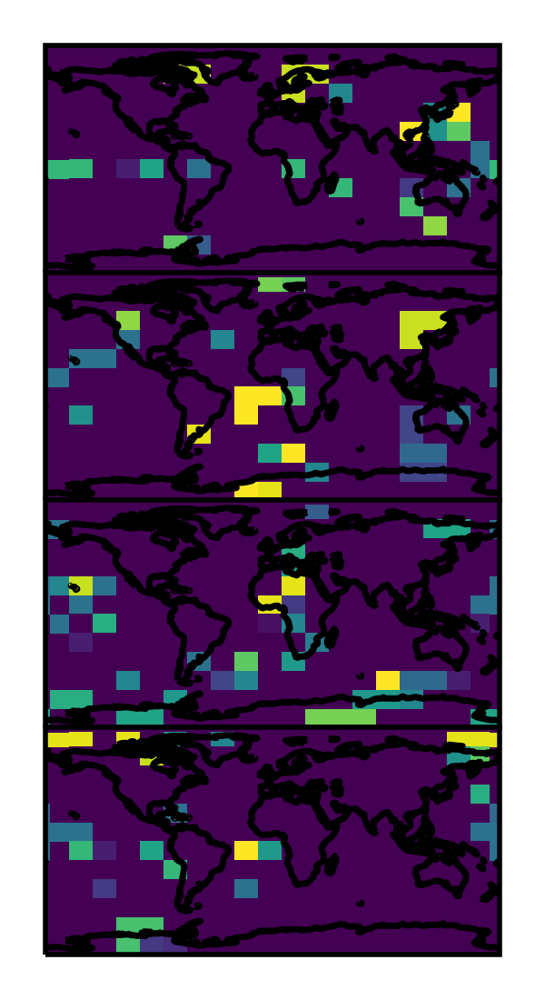

In [32]:
vmin = 0
vmax = 12
source=1
target=0

fig = plt.figure(figsize=2*np.array([2, 1]), dpi=500)
gs0 = fig.add_gridspec(4, 1, wspace=0.0, hspace=0, left=0, right=1, bottom=0, top=1)

ax = fig.add_subplot(gs0[0, 0], projection=ccrs.PlateCarree())
cr_causality.lag.loc[dict(season=1, source=source, target=target)].plot(ax=ax, add_colorbar=False, add_labels=False)
ax.coastlines(color='k')

ax = fig.add_subplot(gs0[1, 0], projection=ccrs.PlateCarree())
cr_causality.lag.loc[dict(season=4, source=source, target=target)].plot(ax=ax, add_colorbar=False, add_labels=False)
ax.coastlines(color='k')

ax = fig.add_subplot(gs0[2, 0], projection=ccrs.PlateCarree())
cr_causality.lag.loc[dict(season=7, source=source, target=target)].plot(ax=ax, add_colorbar=False, add_labels=False)
ax.coastlines(color='k')

ax = fig.add_subplot(gs0[3, 0], projection=ccrs.PlateCarree())
cr_causality.lag.loc[dict(season=10, source=source, target=target)].plot(ax=ax, add_colorbar=False, add_labels=False)
ax.coastlines(color='k')

In [33]:
lag = cr_causality.lag
winter = lag.loc[dict(season=1, source=source, target=target)].squeeze()
spring = lag.loc[dict(season=4, source=source, target=target)].squeeze()
summer = lag.loc[dict(season=7, source=source, target=target)].squeeze()
fall = lag.loc[dict(season=10, source=source, target=target)].squeeze()

all_year = winter.where(np.logical_and(np.logical_and(np.logical_and(winter>0, spring>0), summer>0), fall>0))
all_year_stack = all_year.stack(notnull=['lat','lon']) 
all_year_stack = all_year_stack[all_year_stack.notnull()]

all_year_stack

<xarray.DataArray 'lag' (notnull: 0)>
array([], dtype=float64)
Coordinates:
    season   int32 1
    source   int32 1
    target   int32 0
  * notnull  (notnull) object MultiIndex
  * lat      (notnull) float64 
  * lon      (notnull) float64

### Plot random candidate sequence

In [34]:
# Find non-zero lags and associated coordinates
lag = cr_causality.lag
winter = lag.loc[dict(season=1, source=source, target=target)].squeeze()
winter = winter.where(winter>0)

winter_stacked = winter.stack(notnull=['lat','lon']) 
winter_non_zero = winter_stacked[winter_stacked.notnull()]

(3666.0, 19281.0)

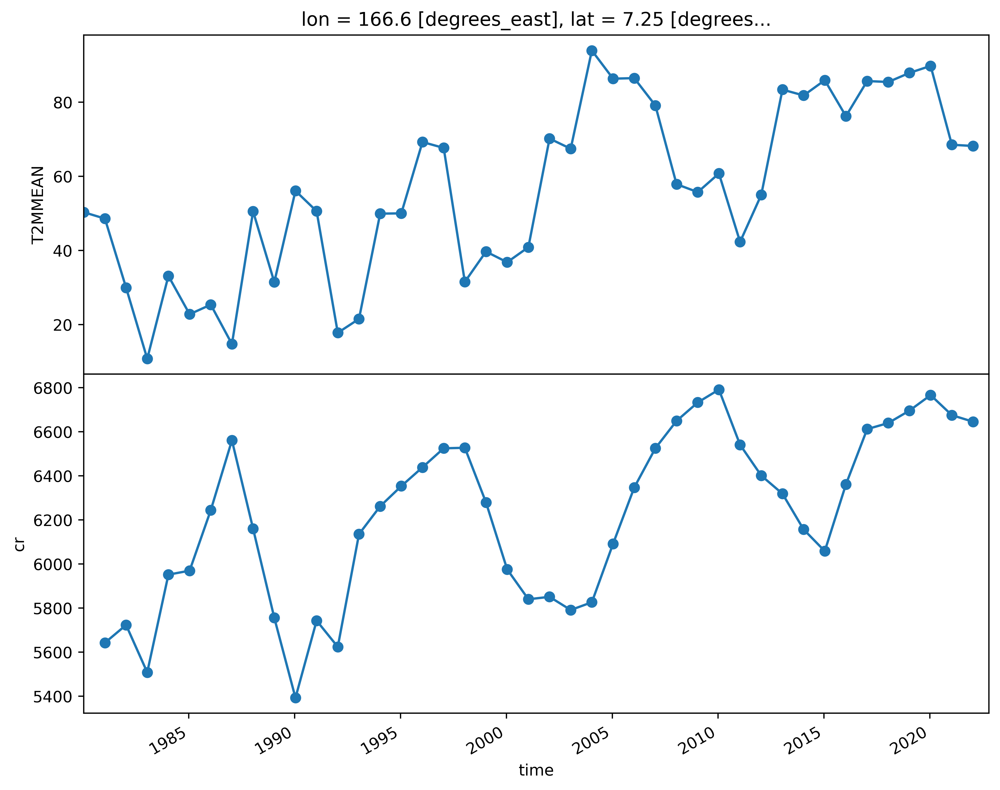

In [35]:
month = 1
rand_index = np.random.randint(0, winter_non_zero.lat.shape[0]-1)
lat = winter_non_zero.lat.data[rand_index]
lon = winter_non_zero.lon.data[rand_index]


fig = plt.figure(figsize=2*np.array([4, 3]), dpi=500)
gs0 = fig.add_gridspec(2, 1, wspace=0.15, hspace=0, left=0, right=1, bottom=0, top=1)


ax = fig.add_subplot(gs0[0, 0])

geo_slice = geo_data_coarse.groupby('lat')[lat].groupby('lon')[lon].groupby('time.month')
geo_slice[month]['T2MMEAN'].plot(ax=ax, marker='o')

ax.set_xlim([np.min(geo_data_coarse.time.data), np.max(geo_data_coarse.time.data)])


ax = fig.add_subplot(gs0[1, 0])
cr_slice = cr.groupby('time.month')
cr_slice[month]['cr'].plot(ax=ax, marker='o')

ax.set_xlim([np.min(geo_data_coarse.time.data), np.max(geo_data_coarse.time.data)])